In [1]:
import pickle
import pandas as pd
import jax
import jax.numpy as jnp

from ott.geometry import pointcloud
from ott.solvers import linear
import seaborn as sns

In [2]:
default_colors = {
    "indigo": "#332288",
    "cyan": "#88CCEE",
    "teal": "#44AA99",
    "green": "#117733",
    "olive": "#999933",
    "sand": "#DDCC77",
    "rose": "#CC6677",
    "wine": "#882255",
    "purple": "#AA4499",
    "grey": "#DDDDDD",
}

In [3]:
data = pd.read_csv("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/conditional-monge/experiments/cmonge/sel_CARs_LN_True_grad_acc_4_cosine/expression.csv", index_col=0)
meta = pd.read_csv("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/conditional-monge/experiments/cmonge/sel_CARs_LN_True_grad_acc_4_cosine/meta.csv", index_col=0)


In [4]:
data

,subset_CAR,0,1,2,3,4,5,6,7,8,...,72,73,74,75,76,77,78,79,80,81
0,CD4_41BB-41BB-z,0.000000,1.647964,0.000000,0.874967,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.874967,1.647964,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,CD4_41BB-41BB-z,0.000000,0.427314,0.427314,0.000000,0.000000,0.000000,0.725744,0.000000,0.000000,...,0.000000,1.926360,0.000000,0.427314,0.427314,0.000000,0.000000,0.000000,0.000000,0.725744
2,CD4_41BB-41BB-z,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,2.325011,0.000000,1.326555,0.000000,0.000000,0.000000,0.000000,0.653720,0.000000
3,CD4_41BB-41BB-z,0.000000,0.000000,1.143916,0.000000,1.143916,0.000000,0.000000,1.143916,0.000000,...,0.000000,1.663561,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,CD4_41BB-41BB-z,0.000000,1.154618,0.000000,0.000000,0.000000,2.641687,0.000000,1.360228,0.000000,...,2.343297,0.544804,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52558,CD8_IL15RA-NA-z,0.527769,1.470843,0.407026,0.202124,-0.022918,0.305431,1.046087,0.034783,0.023546,...,0.200629,1.337613,0.099542,-0.112180,1.427022,0.099374,-0.205044,0.919728,1.852035,0.864279
52559,CD8_IL15RA-NA-z,0.800821,0.737004,0.672297,-0.131685,0.017391,0.784432,0.381043,0.016641,0.062264,...,0.574317,0.828368,0.087184,0.023754,0.411553,0.099488,-0.021780,-0.137866,0.241137,0.182682
52560,CD8_IL15RA-NA-z,4.236609,1.961073,0.265100,-0.226810,-0.053690,0.090297,1.260598,0.223012,-0.002452,...,1.045659,0.606824,-0.020727,0.138628,0.375006,0.114136,0.195883,2.607425,3.438207,2.506224
52561,CD8_IL15RA-NA-z,1.262816,0.415923,0.377654,0.223209,0.076366,0.189270,1.081444,0.046578,-0.052979,...,0.075558,1.209726,0.020545,1.352359,0.339576,-0.066686,-0.024729,1.666534,3.173016,2.021297


In [5]:
meta

,subset_CAR,dtype,condition,split
0,CD4_41BB-41BB-z,target,41BB-41BB-z,ID
1,CD4_41BB-41BB-z,target,41BB-41BB-z,ID
2,CD4_41BB-41BB-z,target,41BB-41BB-z,ID
3,CD4_41BB-41BB-z,target,41BB-41BB-z,ID
4,CD4_41BB-41BB-z,target,41BB-41BB-z,ID
...,...,...,...,...
52558,CD8_IL15RA-NA-z,transport,IL15RA-NA-z,ID
52559,CD8_IL15RA-NA-z,transport,IL15RA-NA-z,ID
52560,CD8_IL15RA-NA-z,transport,IL15RA-NA-z,ID
52561,CD8_IL15RA-NA-z,transport,IL15RA-NA-z,ID


In [6]:
data = data.drop("subset_CAR", axis=1)

In [7]:
with open("/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Model/celltype_models/20240229_from_rocio_for_manuscript_FuncScore_genes_svm.pkl", "rb") as f:
   celltyper = pickle.load(f)
colors = ["#410000", "#E90A19", "#0CB450", "#686B2E",
"#003776", "#D705F2", "#378888", "#C7E3FF",
"#4C004A", "#F37B00", "#C7FF16", "#FFD166",
"#0079C1", "#FF1B7D", "#3CFFE5", "#FFE6F9"]
colordict = dict(zip(celltyper.classes_, colors))

/Users/alicedriessen/.virtualenvs/carot/lib/python3.10/site-packages/sklearn/base.py:440: InconsistentVersionWarning: Trying to unpickle estimator SVC from version 1.5.1 when using version 1.7.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [8]:
import collections
from typing import Any, Dict, Iterable, List, Optional, Tuple, Union
from numpy.typing import ArrayLike
from jax.typing import ArrayLike as JaxArrayLike

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def sankey_with_moscot(
    transition_matrices: List[Union[pd.DataFrame, ArrayLike, JaxArrayLike]],
    source_cell_size: pd.Series,
    target_cell_size: pd.Series,
    colorDict: Union[Dict[Any, str], mpl.colors.ListedColormap],
    captions: Optional[List[str]] = None,
    title: Optional[str] = None,
    figsize: Optional[Tuple[float, float]] = None,
    dpi: Optional[int] = None,
    ax: Optional[mpl.axes.Axes] = None,
    cont_cmap: Union[str, mpl.colors.Colormap] = "viridis",
    fontsize: float = 12.0,
    horizontal_space: float = 1.5,
    force_update_colors: bool = False,
    alpha: float = 1.0,
    interpolate_color: bool = False,
    side_bar_width: float = 0.05,  # width of the bars on left and right of the sankey strips
    **kwargs: Any,
) -> mpl.figure.Figure:
    # Based on https://github.com/theislab/moscot/blob/main/src/moscot/plotting/_utils.py
    # Which in turn is based on https://github.com/anazalea/pySankey/blob/master/pysankey/sankey.py

    if ax is None:
        fig, ax = plt.subplots(constrained_layout=True, dpi=dpi, figsize=figsize)
    else:
        fig = ax.figure
    if captions is not None and len(captions) != len(transition_matrices):
        raise ValueError(
            f"Expected captions to be of length `{len(transition_matrices)}`, found `{len(captions)}`."
        )
    
    left_pos = [0]

    for ind, dataFrame in enumerate(transition_matrices):
        dataFrame, target_df, source_cell_frac, target_cell_frac = check_frames(dataFrame, source_cell_size, target_cell_size)
        leftLabels = list(dataFrame.index)
        rightLabels = list(dataFrame.columns)

        # Determine positions of left label patches and total widths
        leftWidths: Dict[Any, Dict[Any, float]] = collections.defaultdict()
        for i, leftLabel in enumerate(leftLabels):
            myD = {}
            myD["left"] = source_cell_frac[leftLabel]
            if i == 0:
                myD["bottom"] = 0
                myD["top"] = myD["left"]
            else:
                myD["bottom"] = leftWidths[leftLabels[i - 1]]["top"]
                myD["top"] = myD["bottom"] + myD["left"]
                topEdge = myD["top"]
            leftWidths[leftLabel] = myD

        # Determine positions of right label patches and total widths
        rightWidths: Dict[Any, Dict[Any, float]] = collections.defaultdict()
        for i, rightLabel in enumerate(rightLabels):
            myD = {}
            myD["right"] = target_cell_frac[rightLabel]
            if i == 0:
                myD["bottom"] = 0
                myD["top"] = myD["right"]
            else:
                myD["bottom"] = rightWidths[rightLabels[i - 1]]["top"]
                myD["top"] = myD["bottom"] + myD["right"]
                topEdge = myD["top"]
            rightWidths[rightLabel] = myD

        # Total vertical extent of diagram
        xMax = topEdge
        # Draw vertical bars on left and right of each label"s section & print label
        for leftLabel in leftLabels:
            if ind == 0:
                ax.fill_between(
                    [-side_bar_width * xMax, 0],
                    2 * [leftWidths[leftLabel]["bottom"]],
                    2 * [leftWidths[leftLabel]["bottom"] + leftWidths[leftLabel]["left"]],
                    color=colorDict[leftLabel],
                    alpha=1.0,
                    **kwargs,
                )
                ax.text(
                    -0.05 * xMax,
                    leftWidths[leftLabel]["bottom"] + 0.5 * leftWidths[leftLabel]["left"],
                    leftLabel,
                    {"ha": "right", "va": "center"},
                    fontsize=fontsize,
                )
        for rightLabel in rightLabels:
            ax.fill_between(
                [xMax + left_pos[ind], (1 + side_bar_width) * xMax + left_pos[ind]],
                2 * [rightWidths[rightLabel]["bottom"]],
                2 * [rightWidths[rightLabel]["bottom"] + rightWidths[rightLabel]["right"]],
                color=colorDict[rightLabel],
                alpha=1.0,
                **kwargs,
            )
            ax.text(
                1.05 * xMax + left_pos[ind],
                rightWidths[rightLabel]["bottom"] + 0.5 * rightWidths[rightLabel]["right"],
                rightLabel,
                {"ha": "left", "va": "center"},
                fontsize=fontsize,
            )

        if captions is not None:
            ax.text(left_pos[ind] + 0.3 * xMax, -0.1, captions[ind])

        left_pos += [left_pos[-1] + horizontal_space * xMax]

        # Plot strips
        for leftLabel in leftLabels:
            for rightLabel in rightLabels:
                if dataFrame.loc[leftLabel, rightLabel] > 0:
                    # TODO: better check for when to draw strip
                    # Create array of y values for each strip, half at left value,
                    # half at right, convolve
                    ys_d = np.array(50 * [leftWidths[leftLabel]["bottom"]] + 50 * [rightWidths[rightLabel]["bottom"]])
                    ys_d = np.convolve(ys_d, 0.05 * np.ones(20), mode="valid")
                    ys_d = np.convolve(ys_d, 0.05 * np.ones(20), mode="valid")
                    ys_u = np.array(
                        50 * [leftWidths[leftLabel]["bottom"] + dataFrame.loc[leftLabel, rightLabel]]
                        + 50 * [rightWidths[rightLabel]["bottom"] + target_df.loc[leftLabel, rightLabel]]
                    )
                    ys_u = np.convolve(ys_u, 0.05 * np.ones(20), mode="valid")
                    ys_u = np.convolve(ys_u, 0.05 * np.ones(20), mode="valid")

                    

                    # Update bottom edges at each label so next strip starts at the right place
                    leftWidths[leftLabel]["bottom"] += dataFrame.loc[leftLabel, rightLabel]
                    rightWidths[rightLabel]["bottom"] += target_df.loc[leftLabel, rightLabel]


                    arr = np.linspace(
                        0 + left_pos[ind], xMax + left_pos[ind], len(ys_d)
                    )
                    if interpolate_color:
                        color = _color_transition(
                            colorDict[leftLabel],
                            colorDict[rightLabel],
                            num=len(arr),
                            alpha=alpha,
                        )
                        for l in range(len(ys_d)):  # necessary to get smooth lines
                            ax.fill_between(
                                arr[l:],
                                ys_d[l:],
                                ys_u[l:],
                                color=color[l],
                                ec=color[l],
                                alpha=alpha,
                                **kwargs,
                            )
                    else:
                        ax.fill_between(
                            arr,
                            ys_d,
                            ys_u,
                            alpha=alpha,
                            color=colorDict[leftLabel],
                            **kwargs,
                        )

        ax.axis("off")
        ax.set_title(title)
    return fig


def check_frames(df, forward_cell_size, reverse_cell_size):
    forward_df = df.divide(df.sum(axis=1), axis=0)
    reverse_df = df.divide(df.sum(axis=0), axis=1)


    forward_cell_frac = forward_cell_size.divide(forward_cell_size.sum())
    reverse_cell_frac = reverse_cell_size.divide(reverse_cell_size.sum())


    forward_df = forward_df.multiply(forward_cell_size, axis=0)
    forward_df = forward_df.fillna(0)
    forward_df /= forward_cell_size.sum()

    reverse_df = reverse_df.multiply(reverse_cell_size, axis=1)
    reverse_df = reverse_df.fillna(0)
    reverse_df /= reverse_cell_size.sum()

    return forward_df, reverse_df, forward_cell_frac, reverse_cell_frac


CD4_41BB-41BB-z


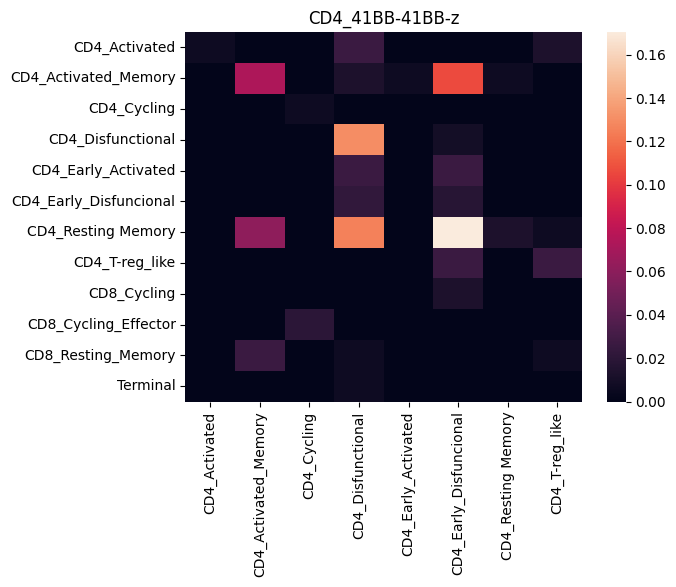

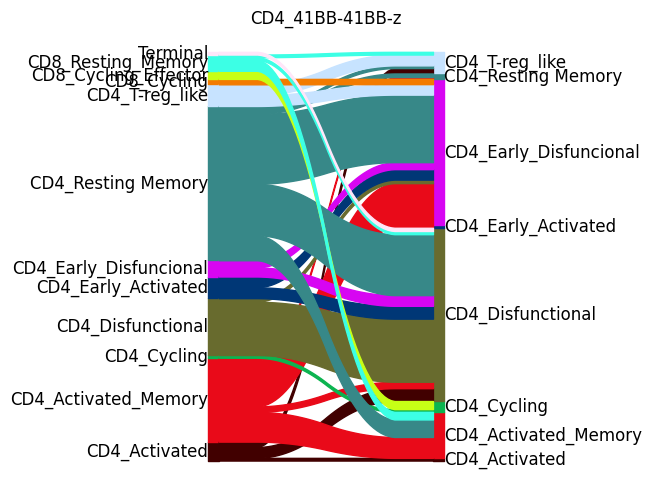

CD4_41BB-CD28-z


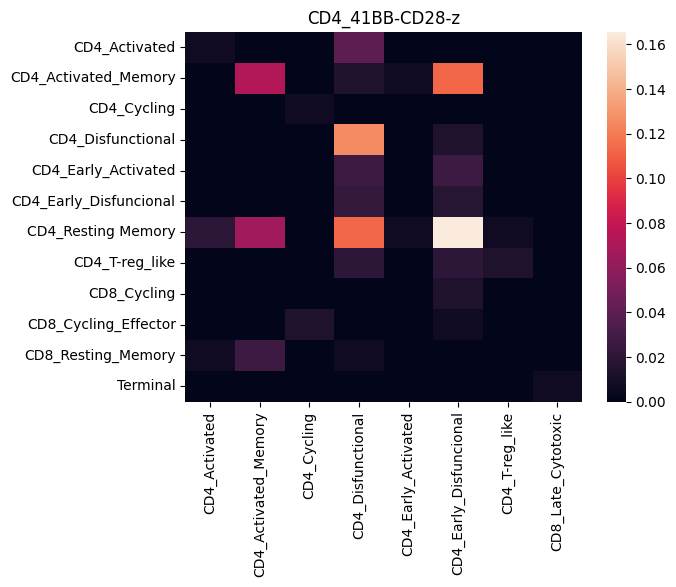

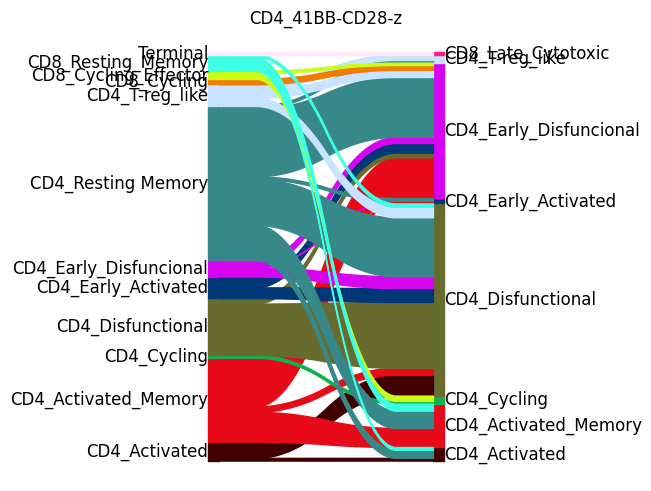

CD4_41BB-CD40-z


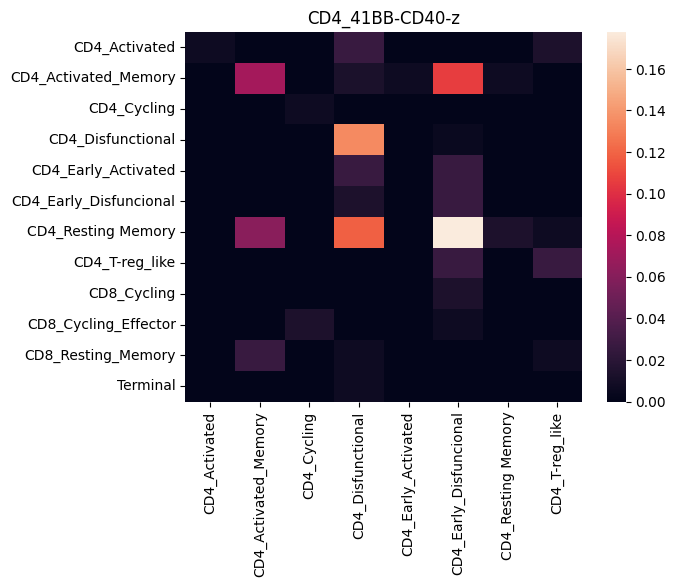

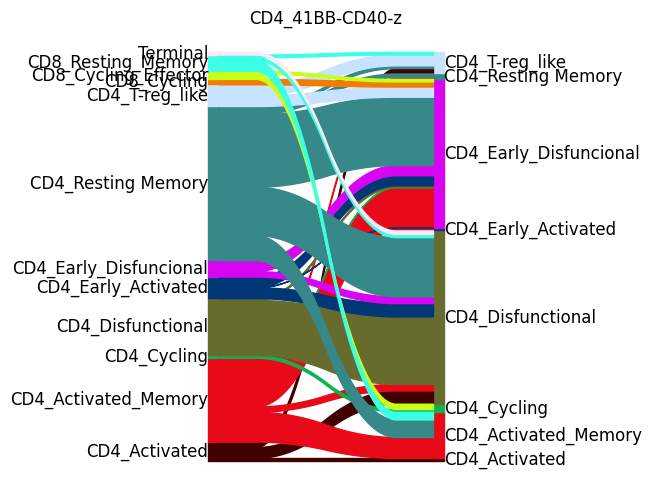

CD4_41BB-CTLA4-z


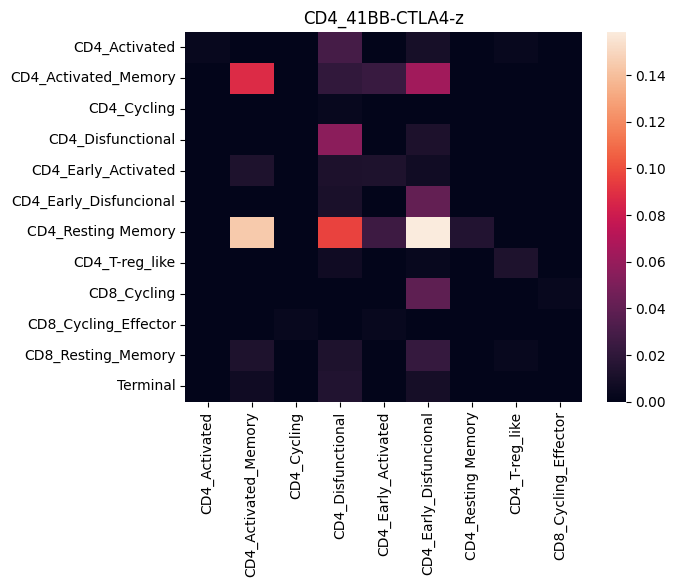

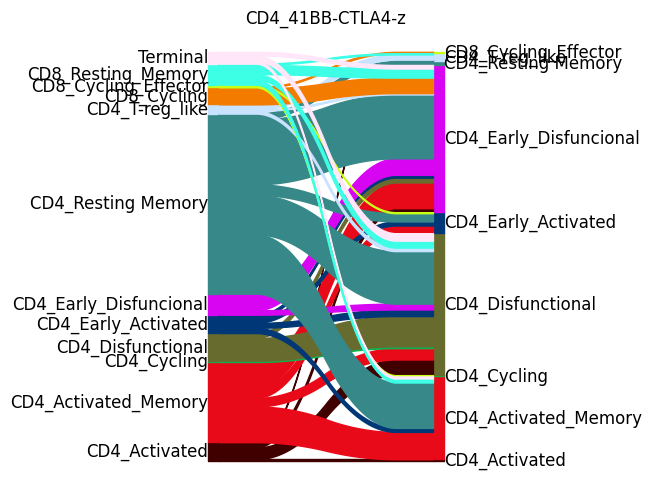

CD4_41BB-IL15RA-z


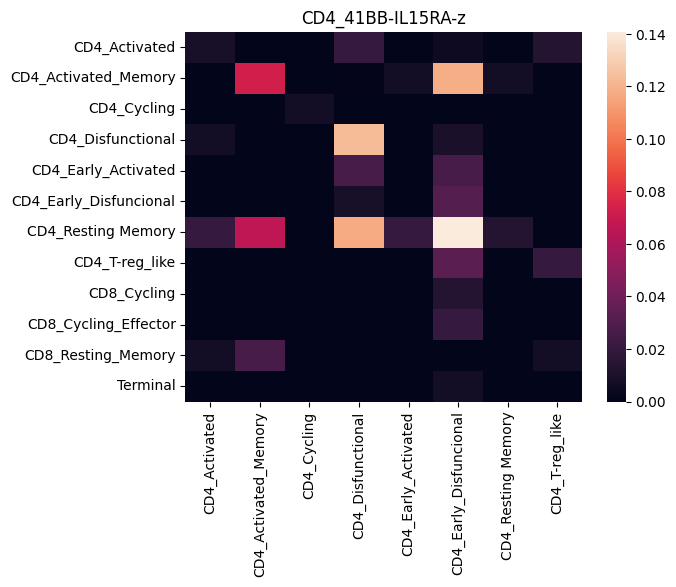

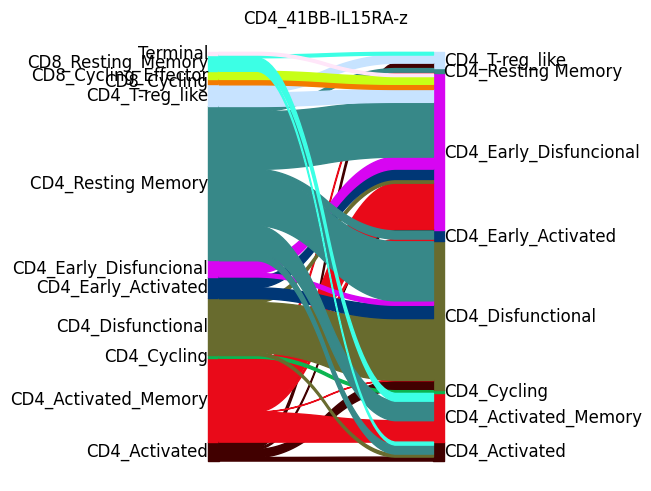

CD4_41BB-NA-z


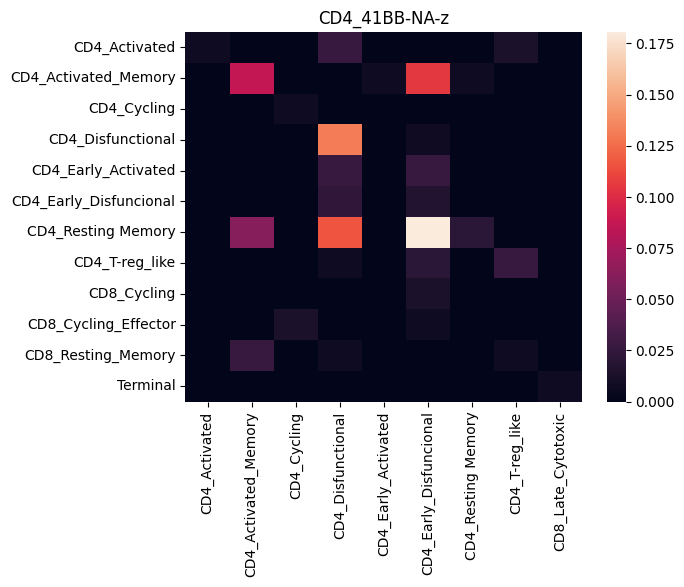

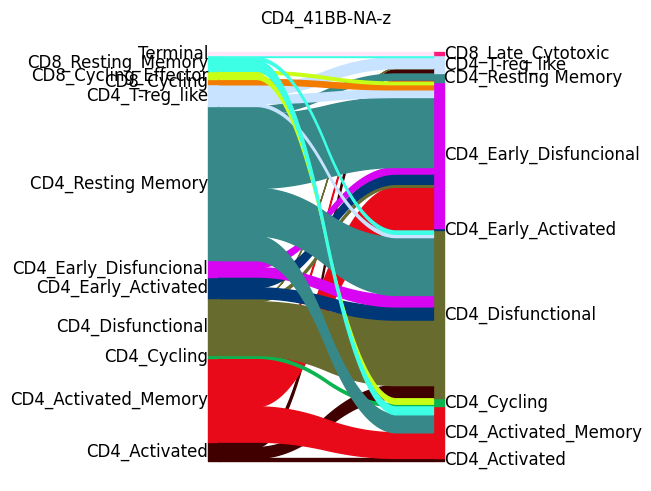

CD4_CD28-41BB-z


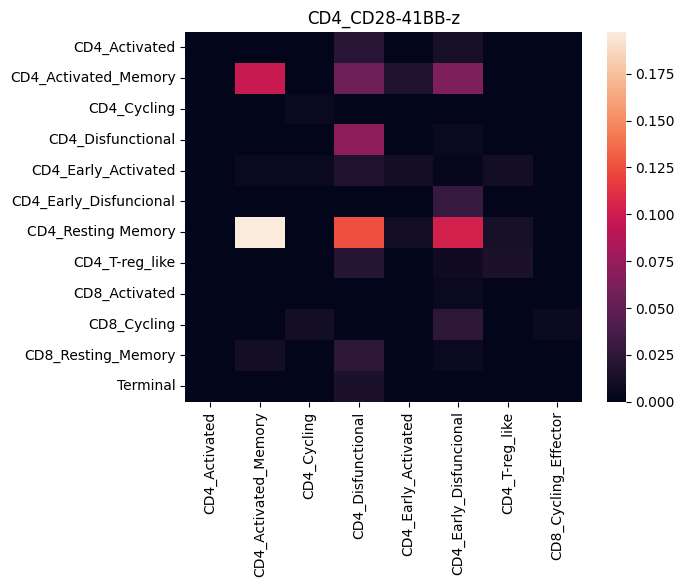

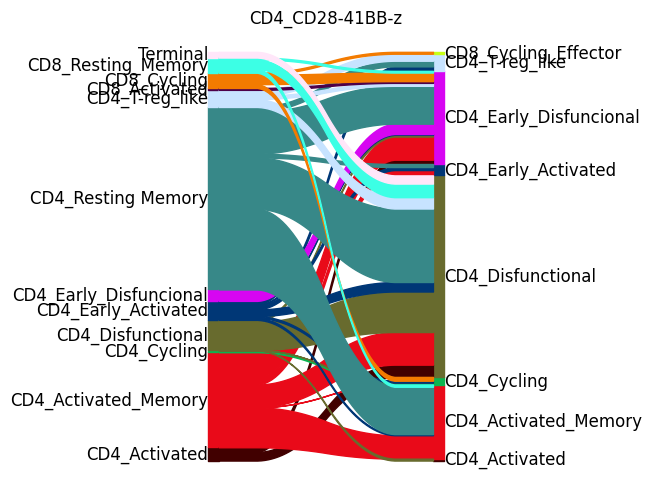

CD4_CD28-CD28-z


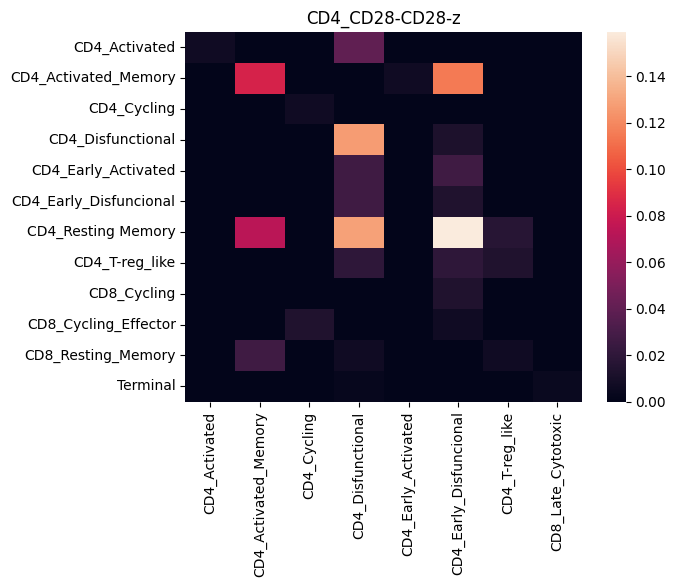

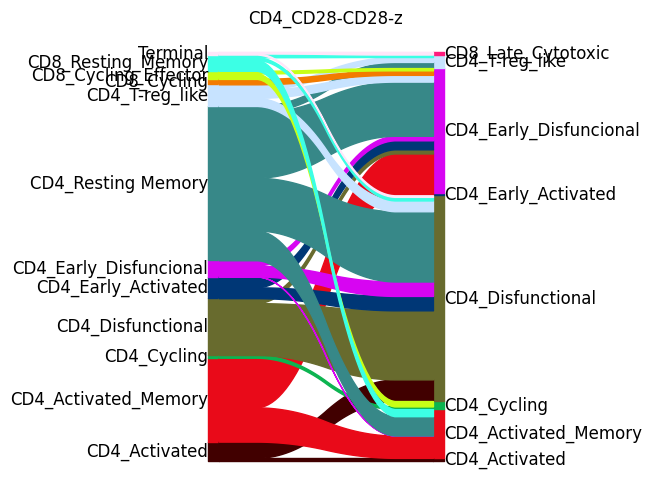

CD4_CD28-CD40-z


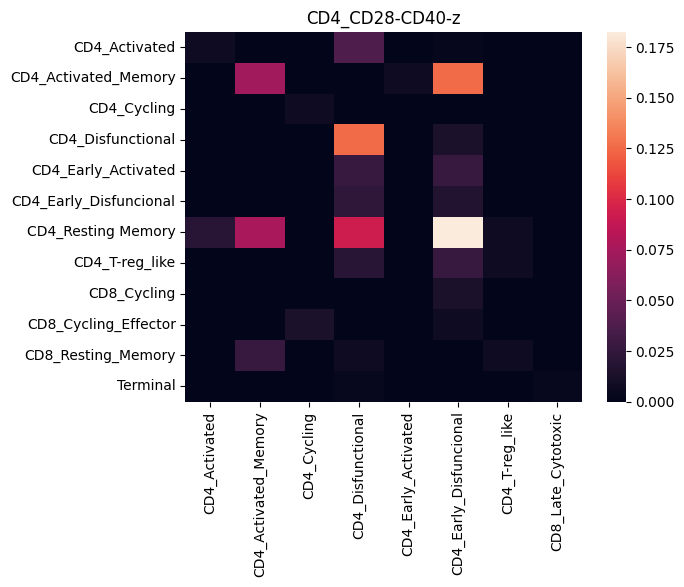

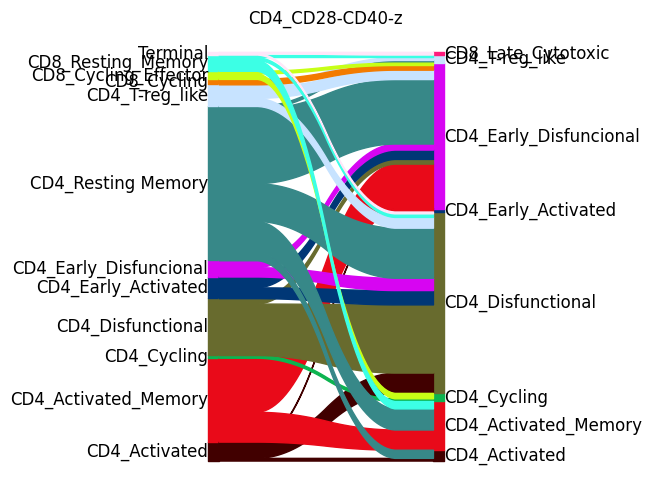

CD4_CD28-CTLA4-z


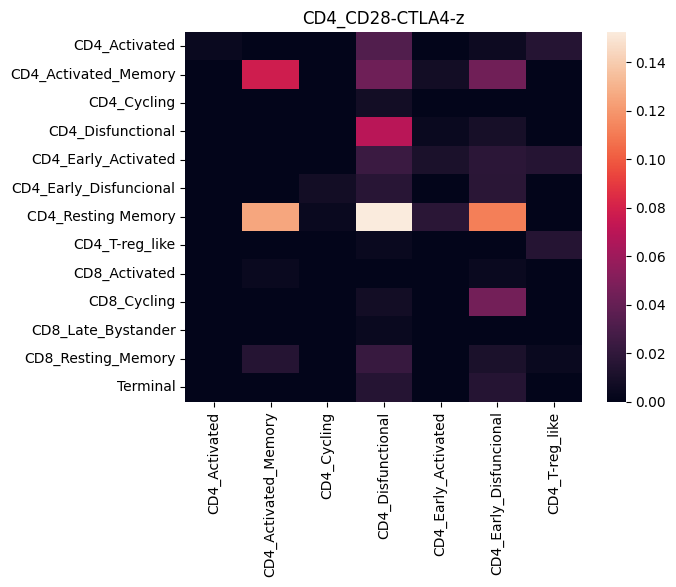

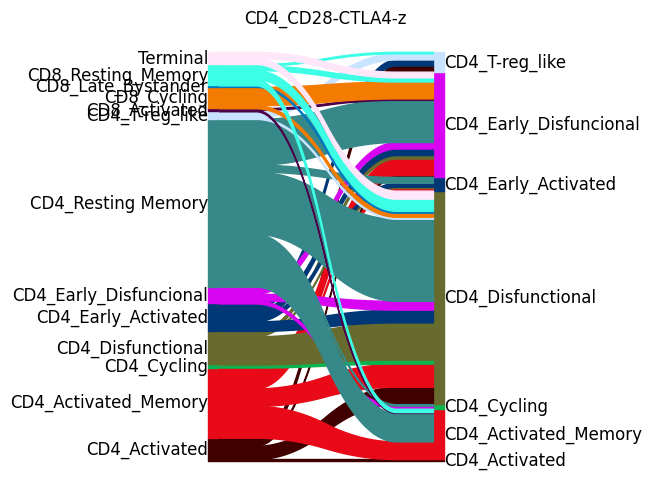

CD4_CD28-IL15RA-z


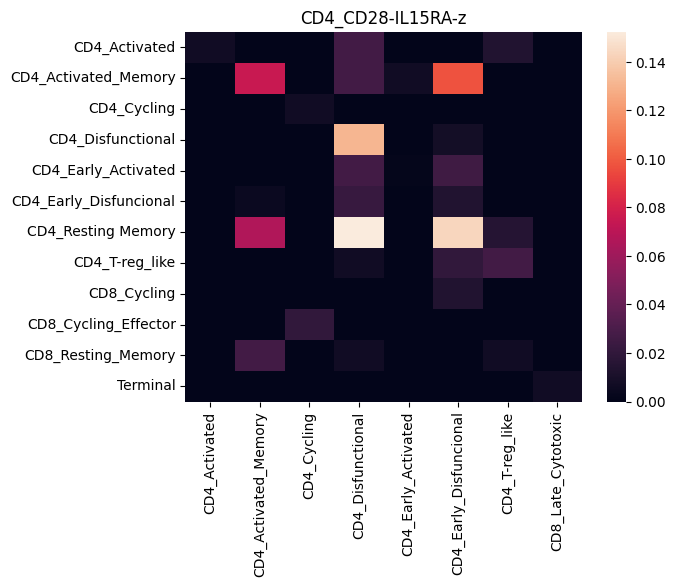

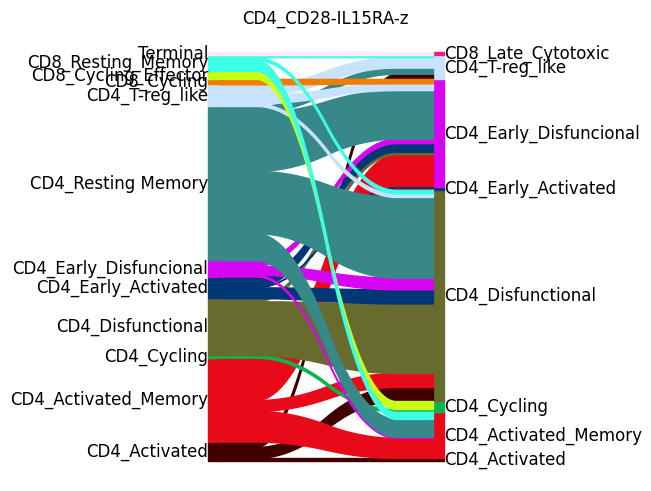

CD4_CD28-NA-z


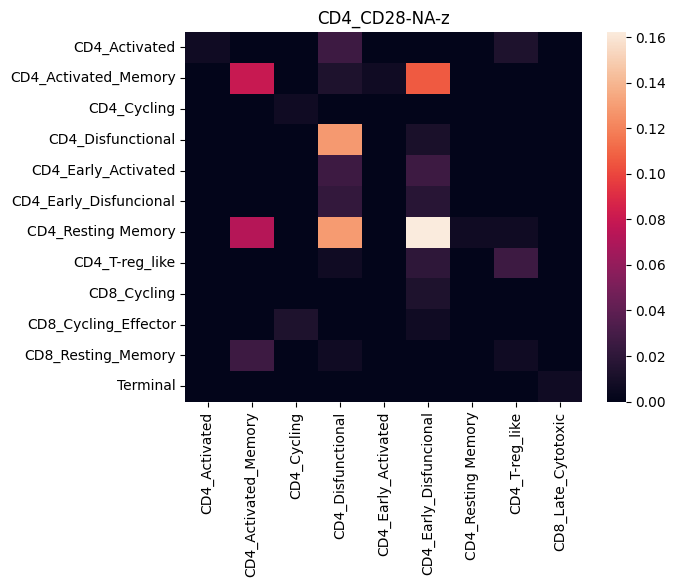

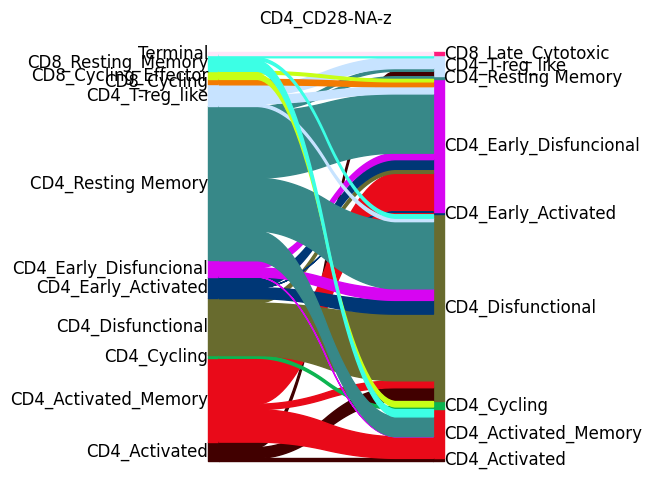

CD4_CD40-41BB-z


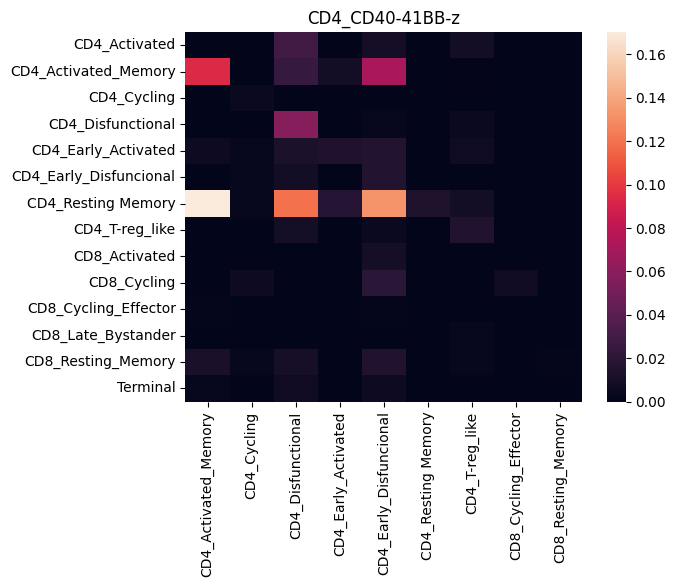

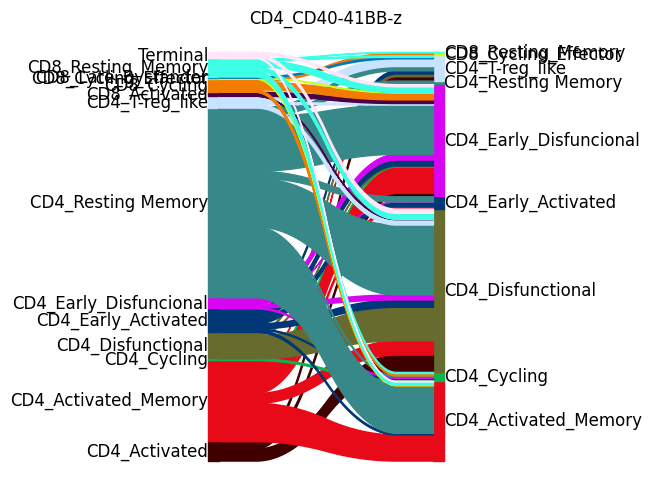

CD4_CD40-CD28-z


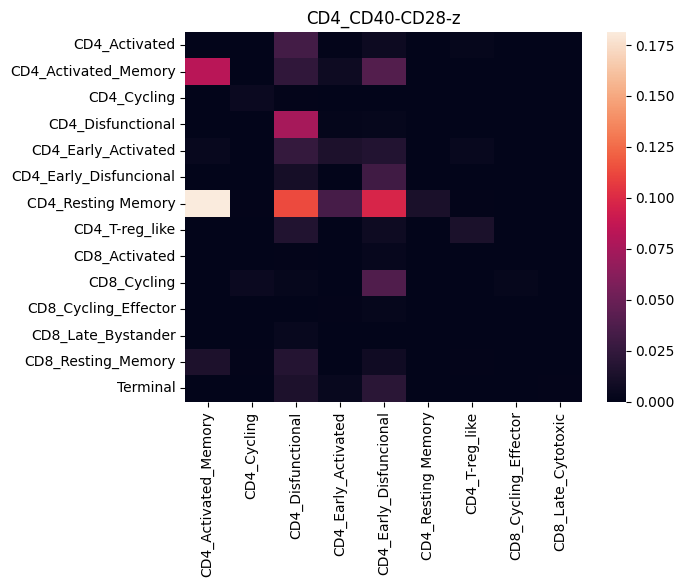

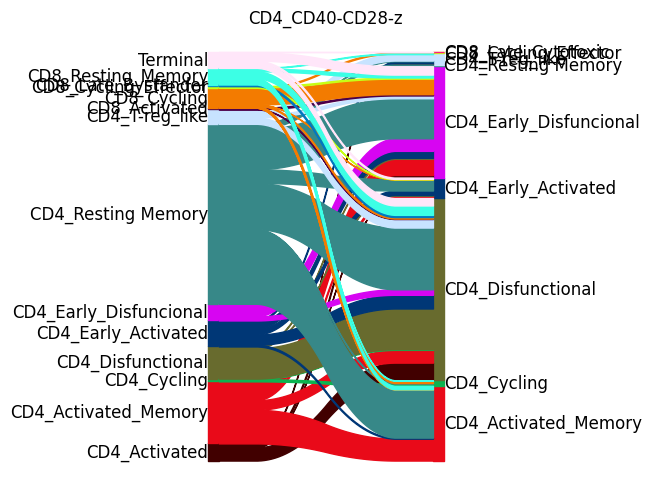

CD4_CD40-CD40-z


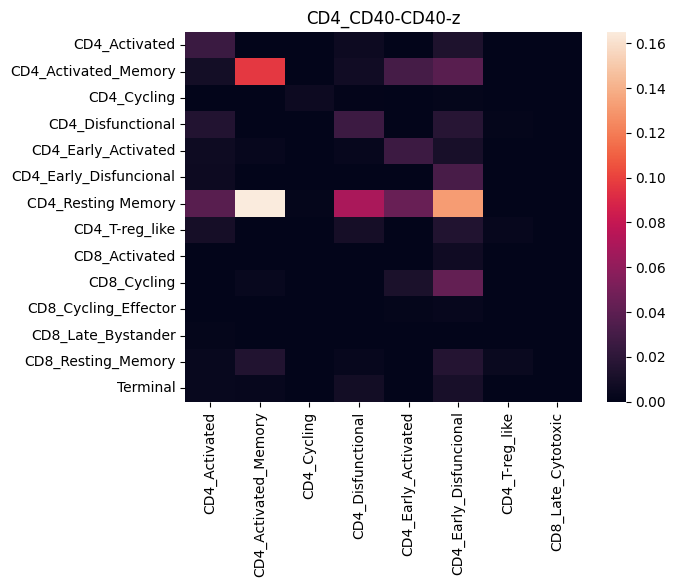

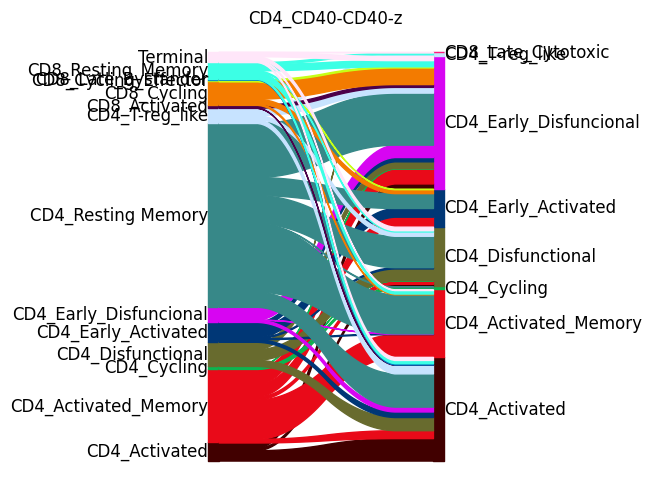

CD4_CD40-CTLA4-z


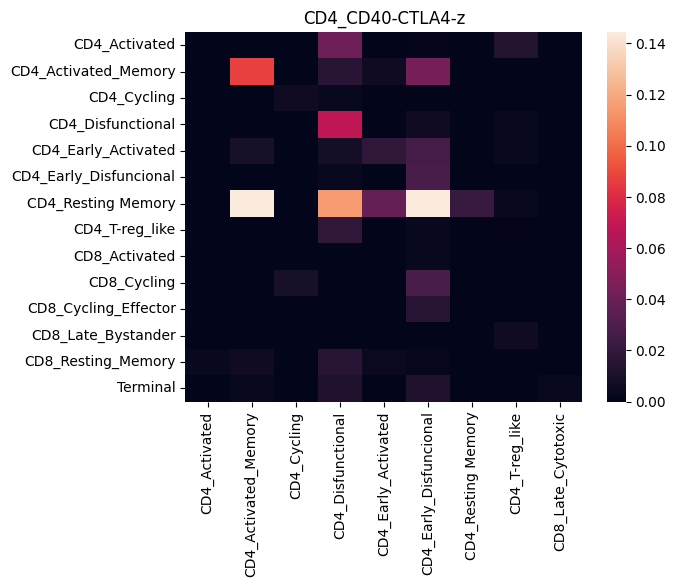

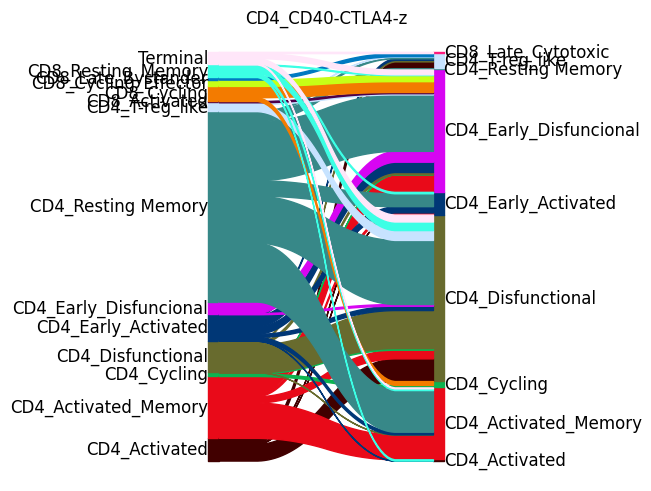

CD4_CD40-IL15RA-z


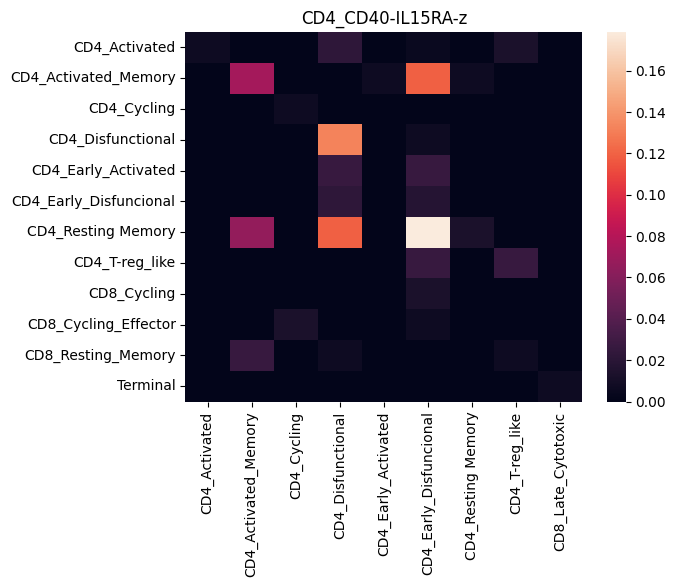

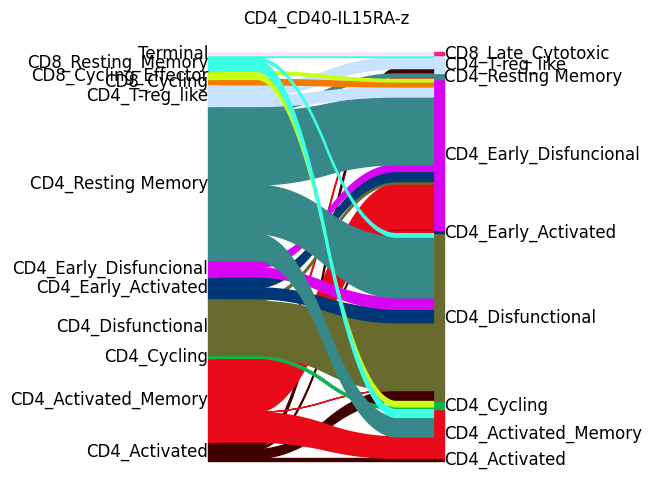

CD4_CD40-NA-z


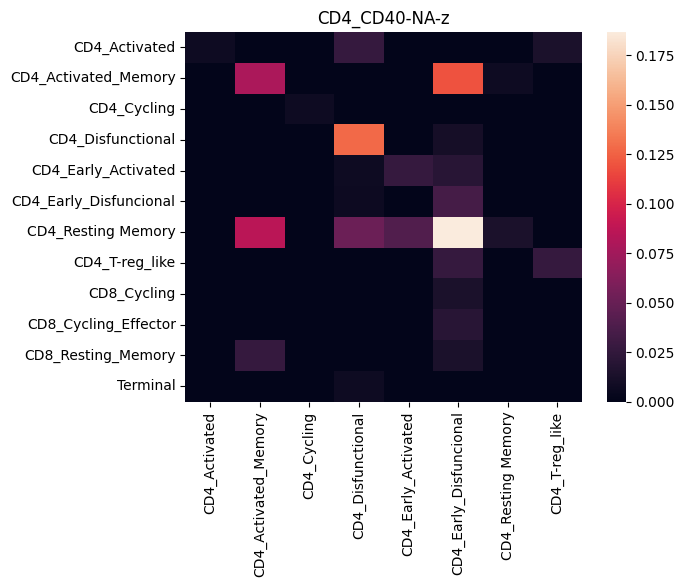

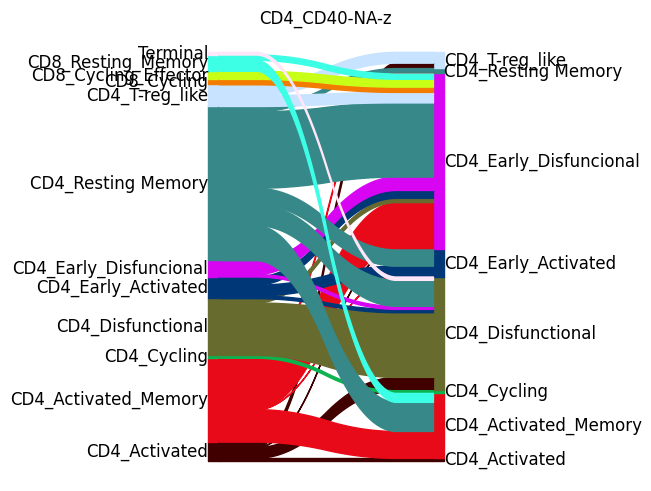

CD4_CTLA4-41BB-z


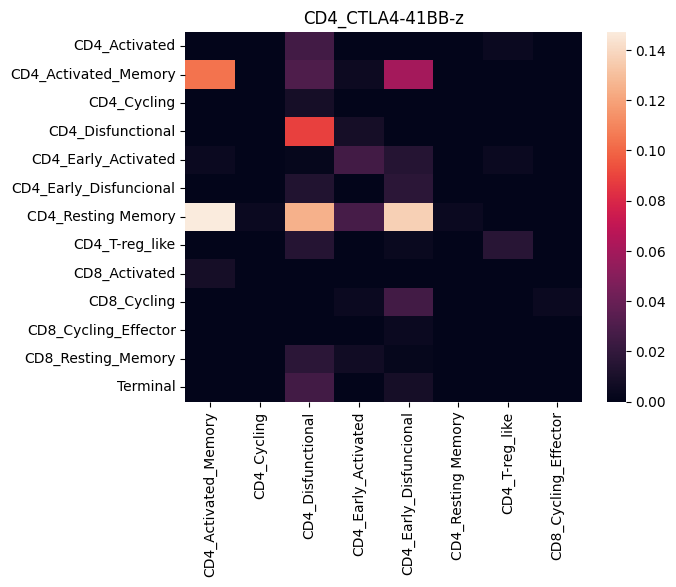

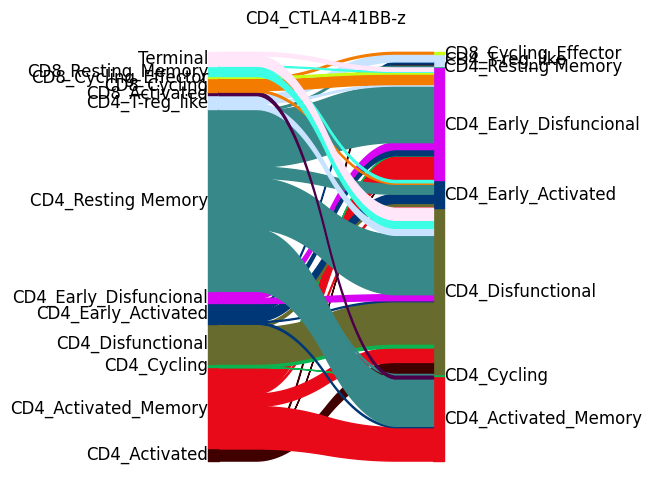

CD4_CTLA4-CD28-z


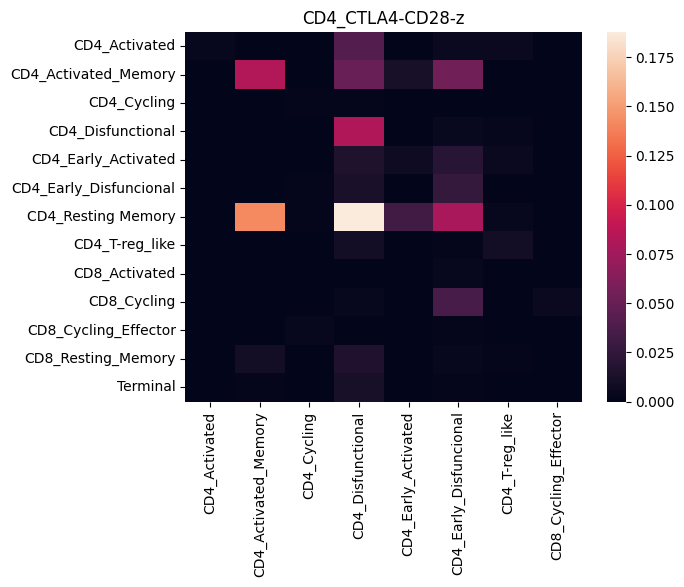

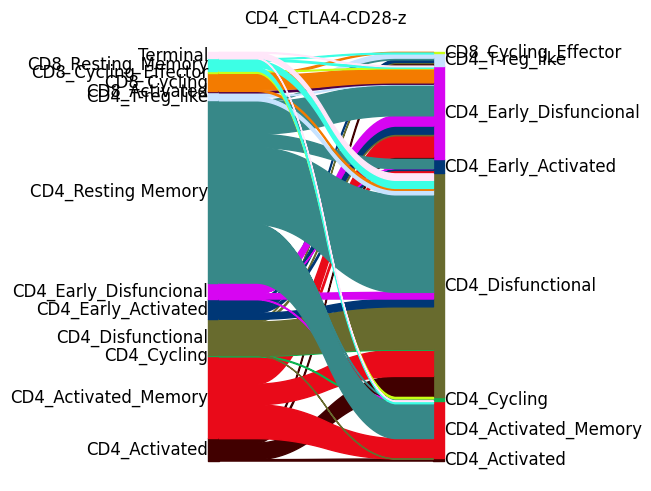

CD4_CTLA4-CD40-z


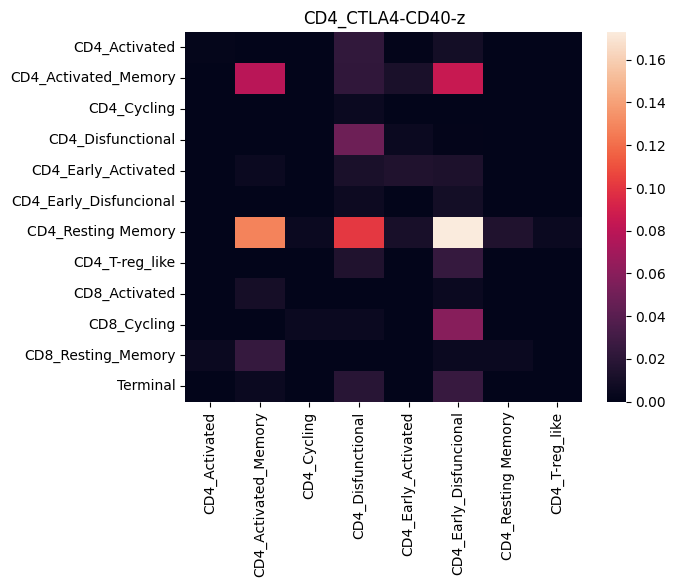

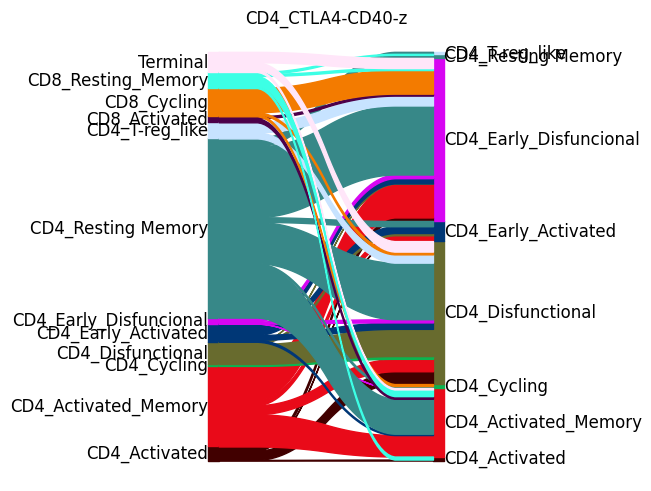

CD4_CTLA4-CTLA4-z


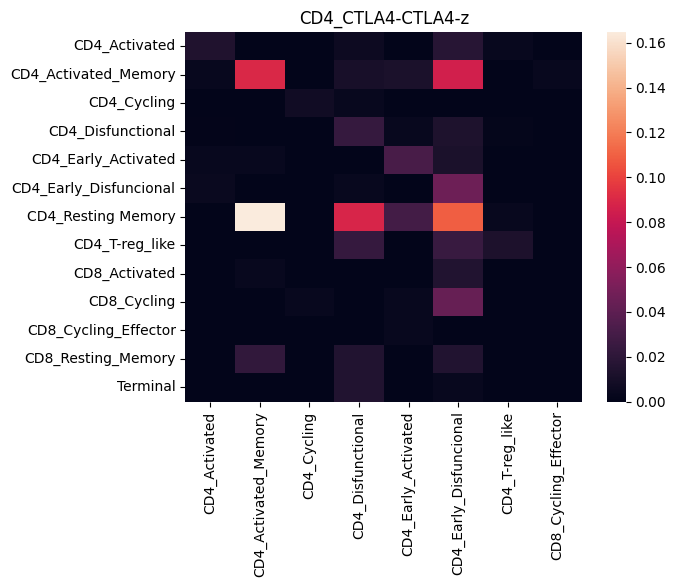

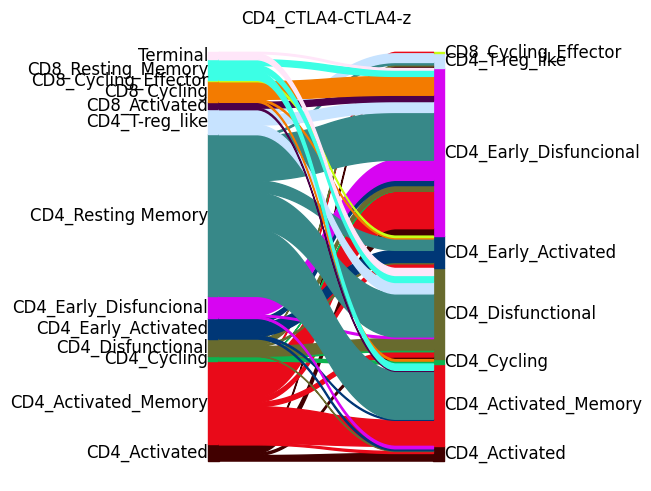

CD4_CTLA4-IL15RA-z


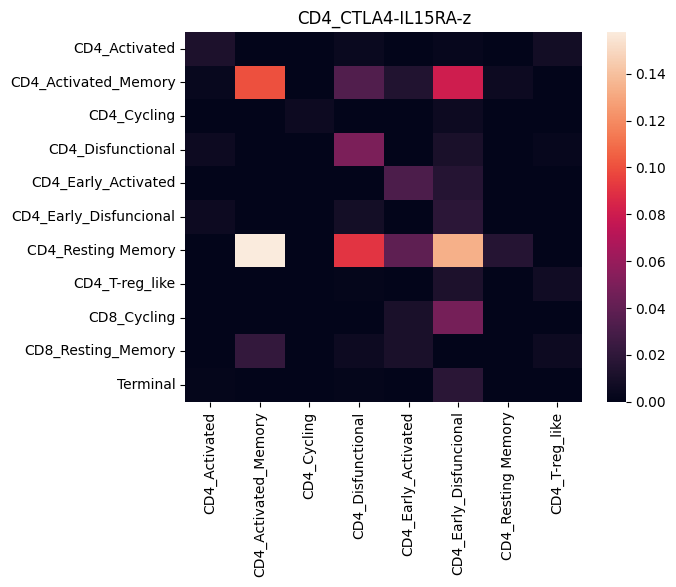

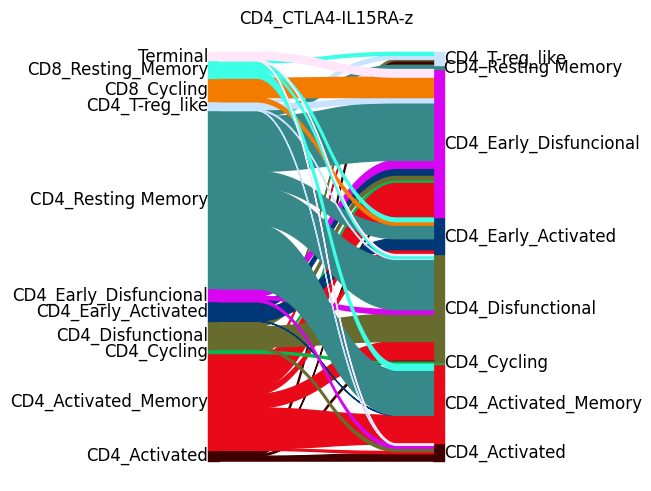

CD4_CTLA4-NA-z


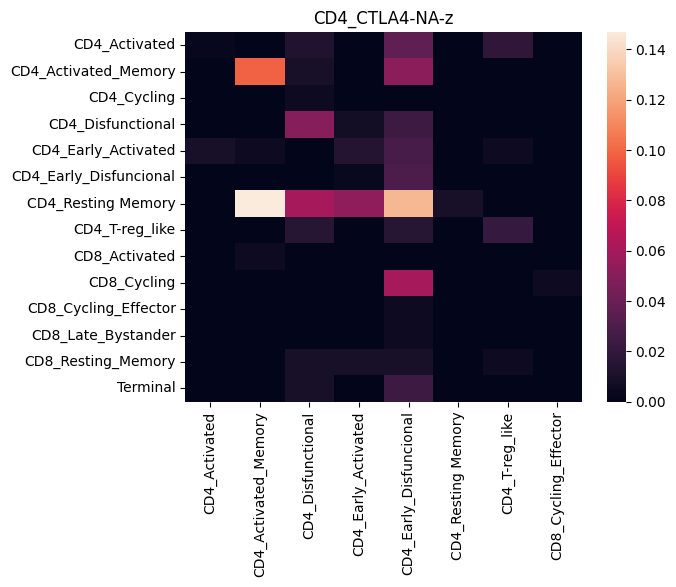

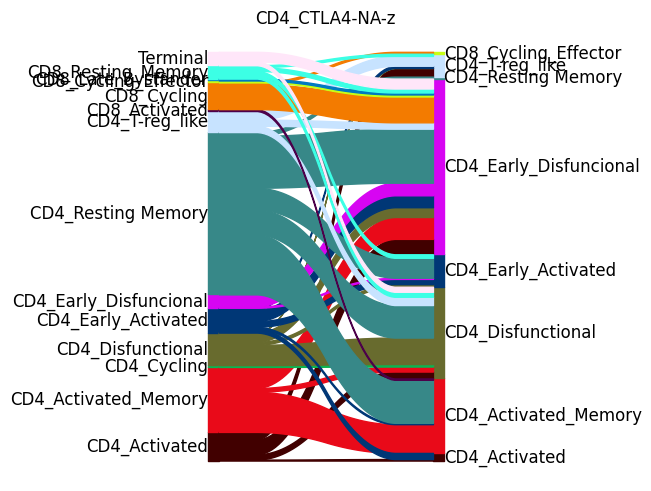

CD4_IL15RA-41BB-z


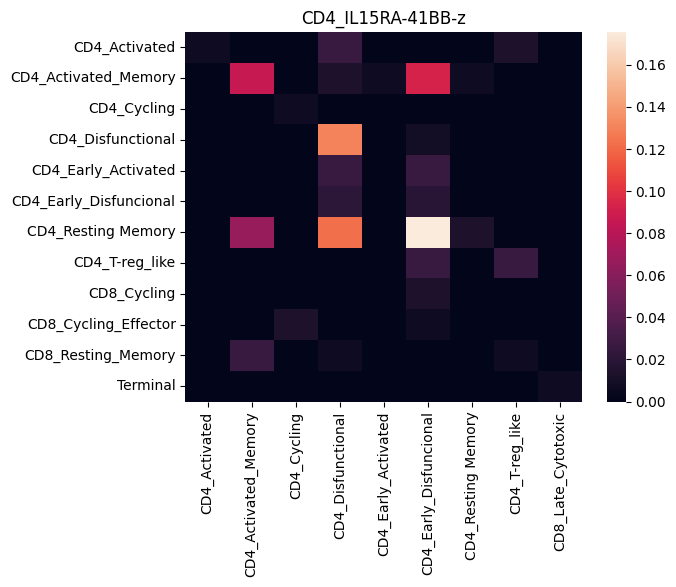

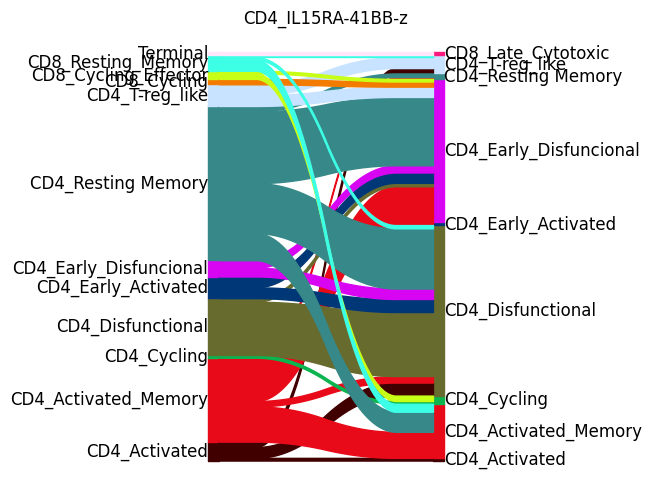

CD4_IL15RA-CD28-z


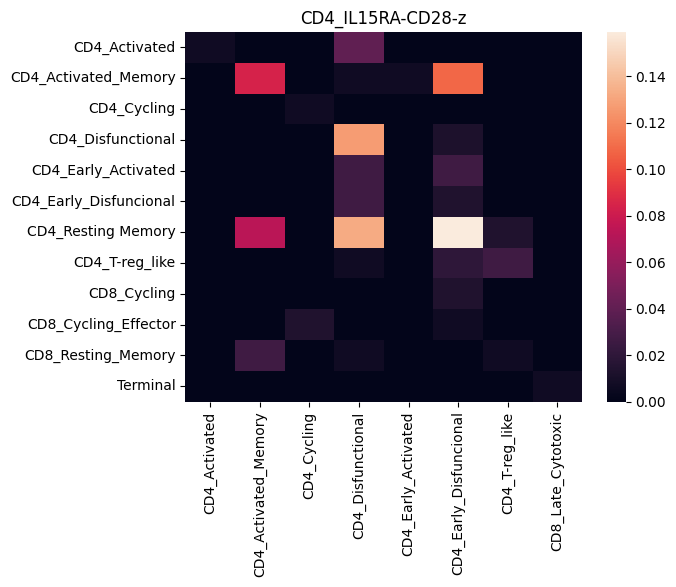

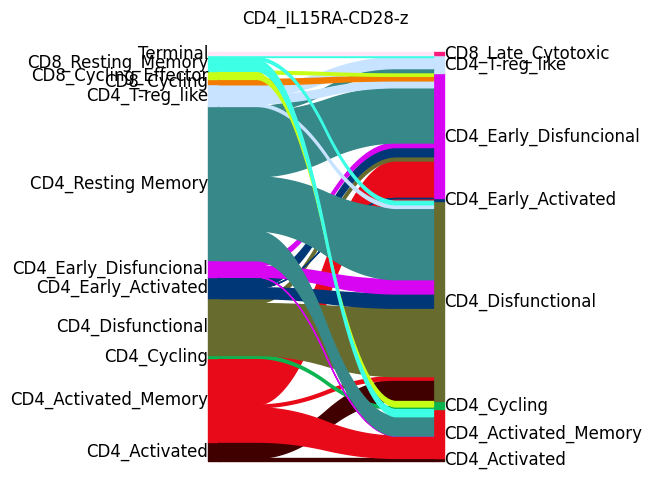

CD4_IL15RA-CD40-z


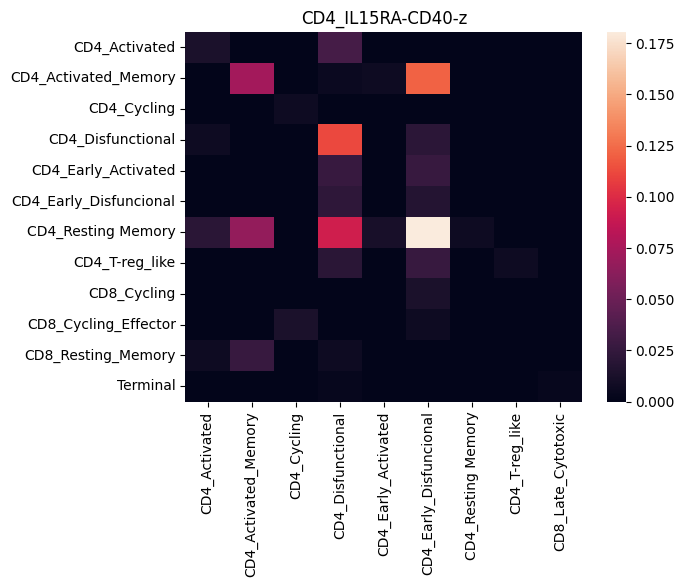

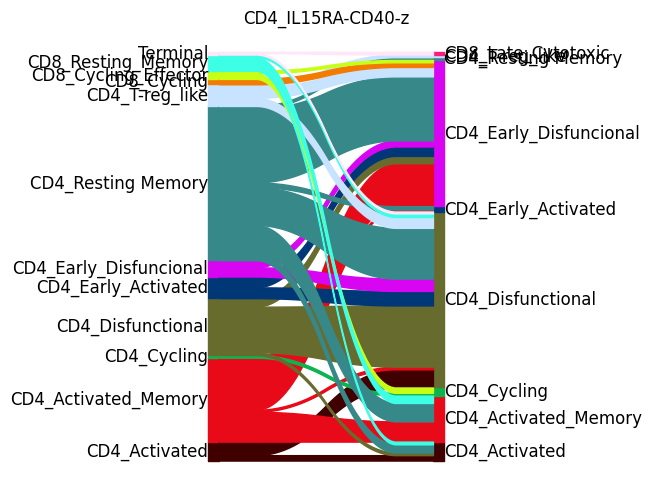

CD4_IL15RA-CTLA4-z


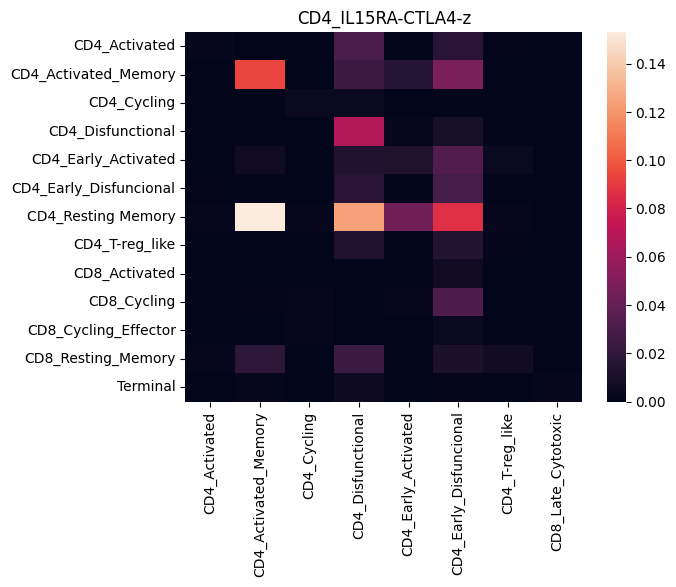

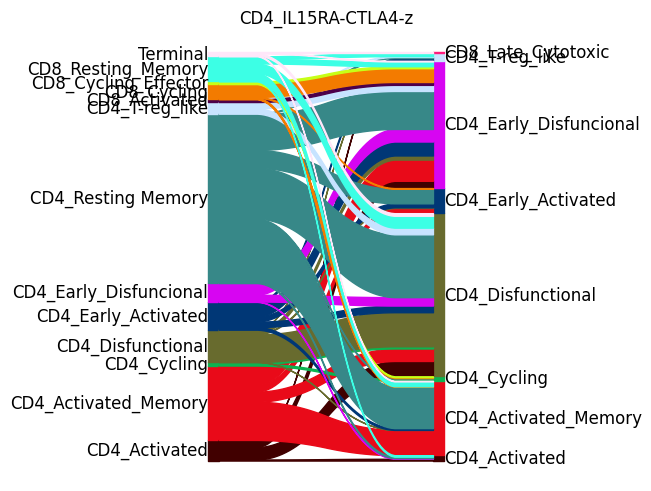

CD4_IL15RA-IL15RA-z


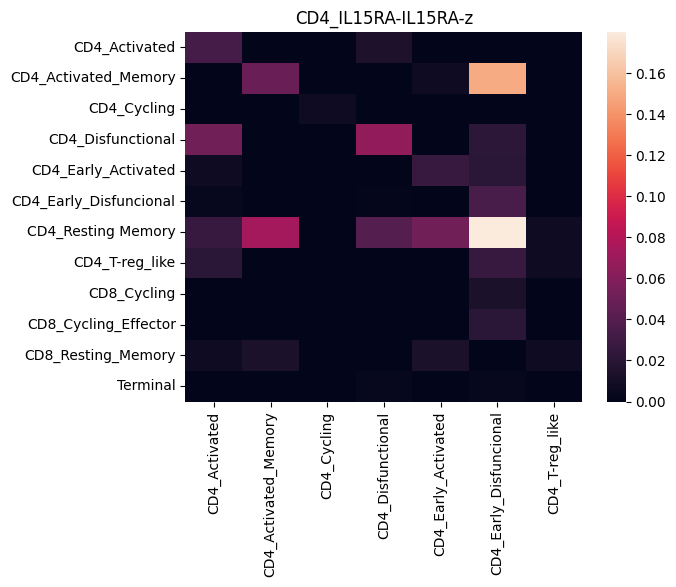

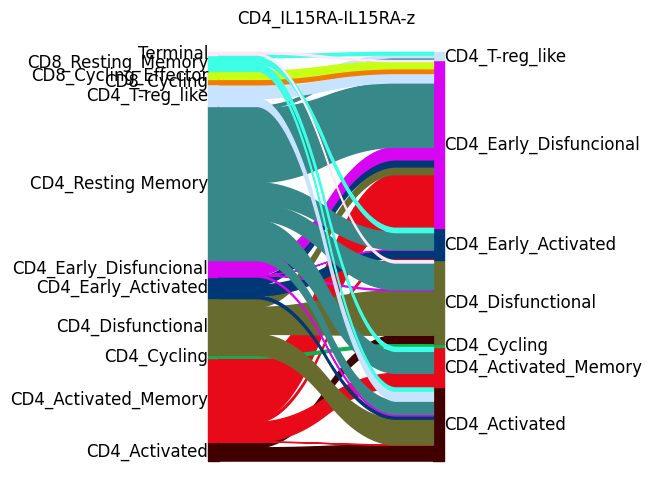

CD4_IL15RA-NA-z


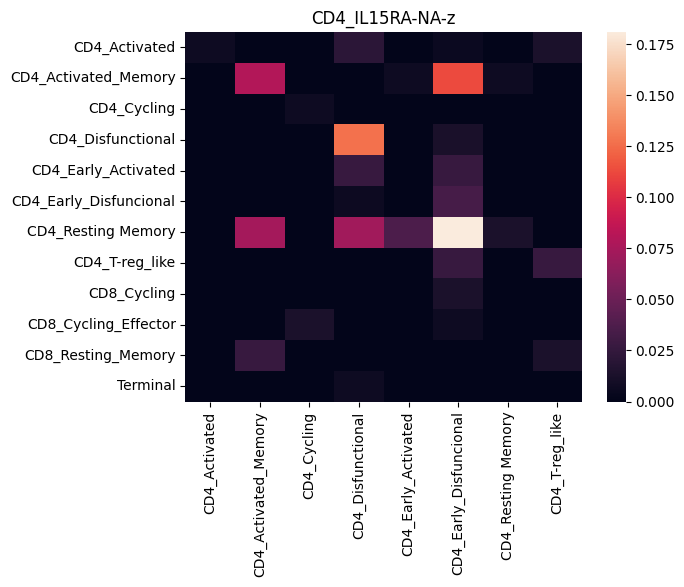

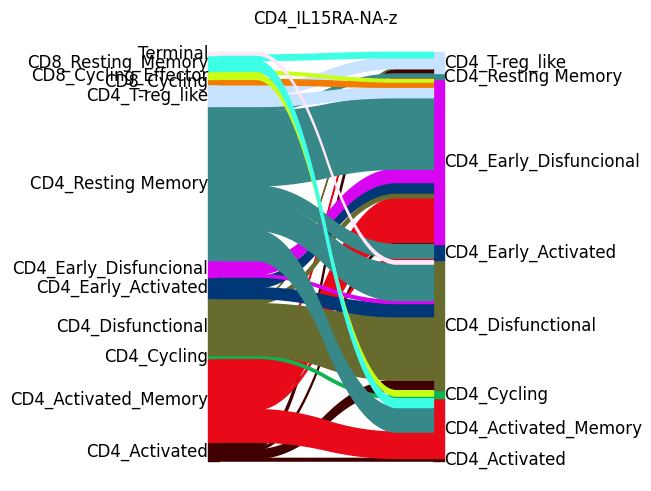

CD8_41BB-41BB-z


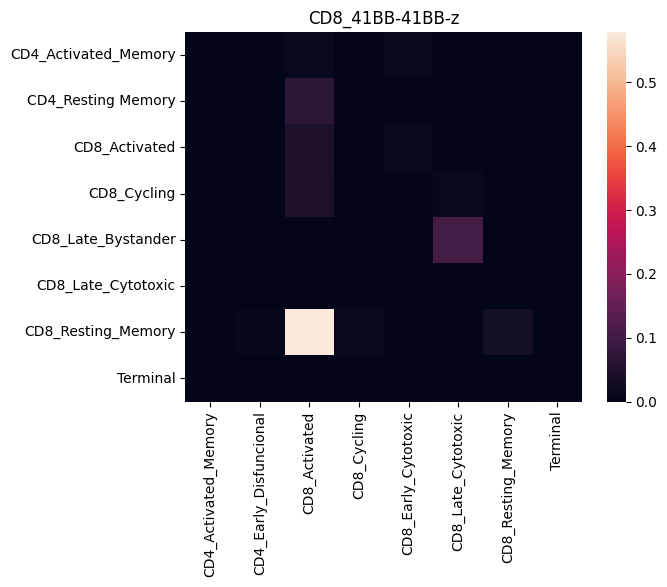

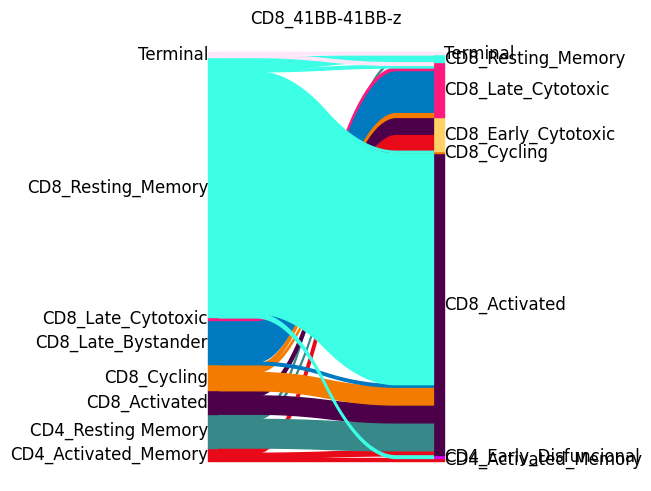

CD8_41BB-CD28-z


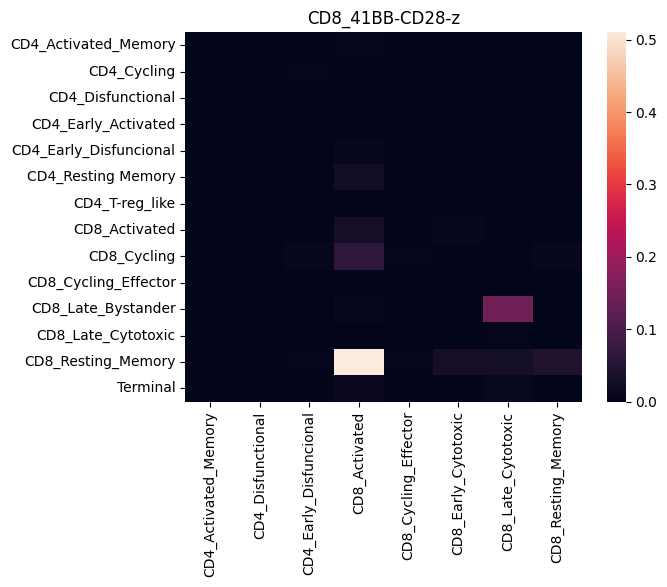

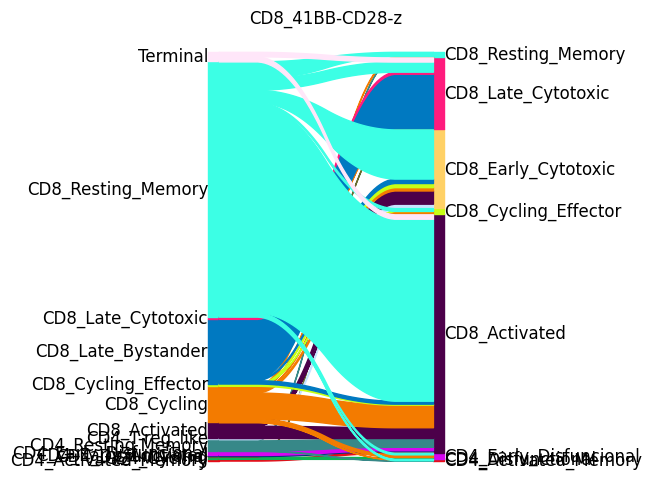

CD8_41BB-CD40-z


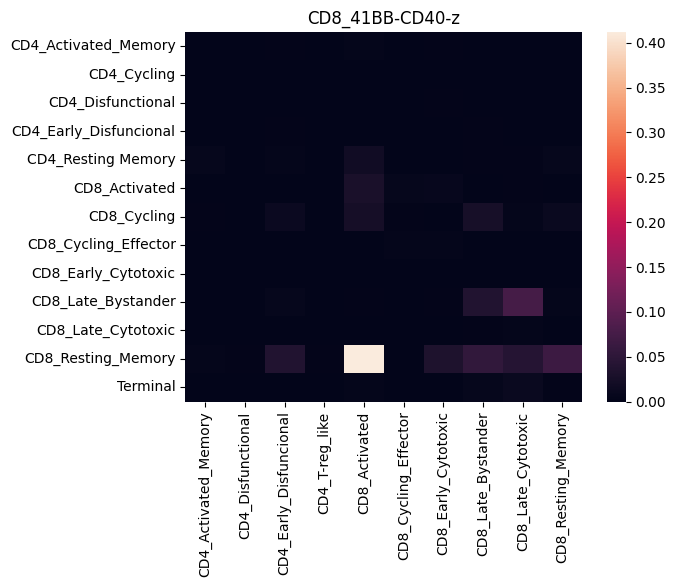

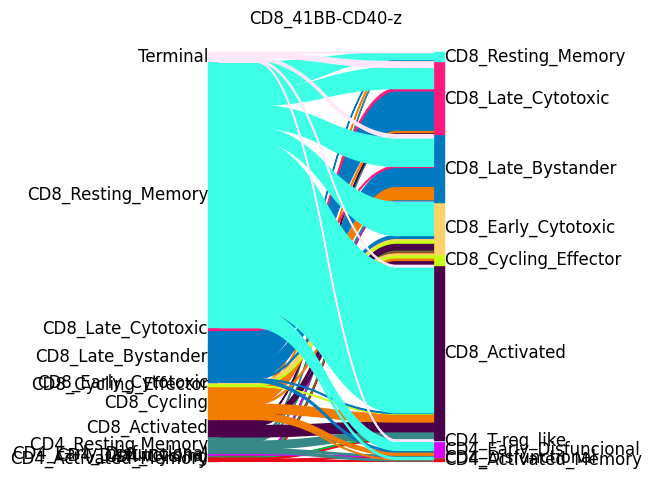

CD8_41BB-CTLA4-z


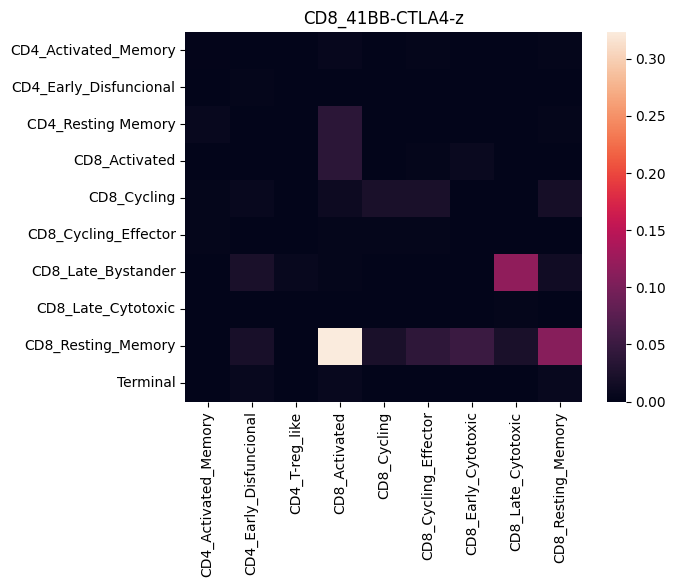

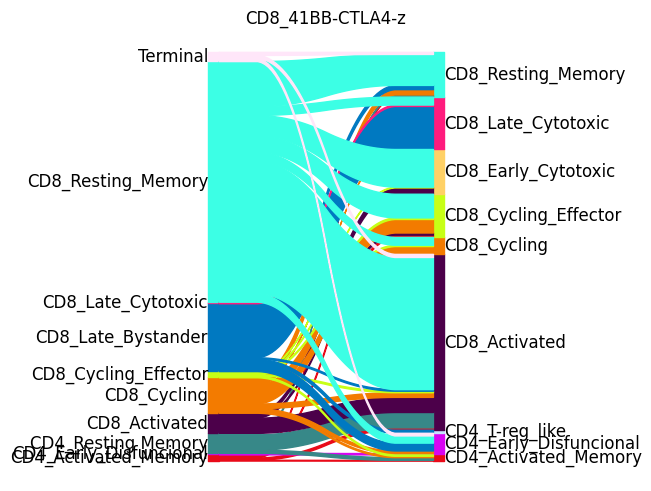

CD8_41BB-IL15RA-z


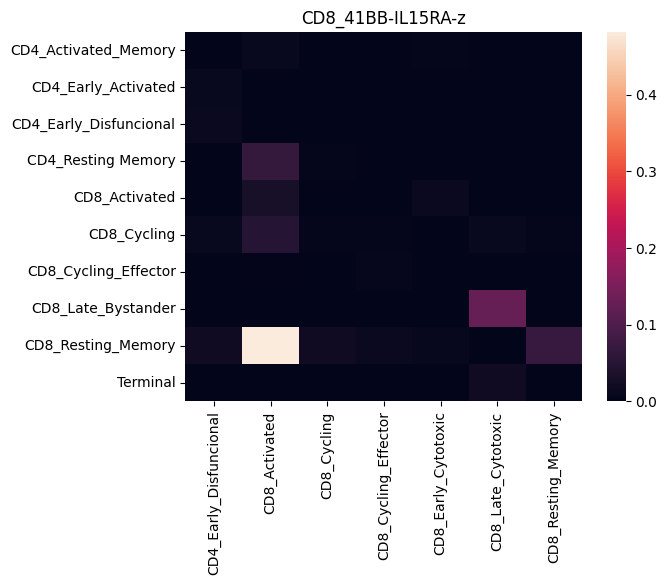

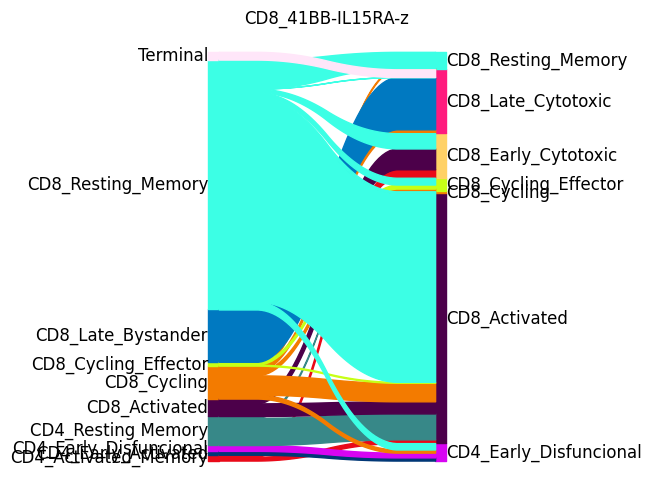

CD8_41BB-NA-z


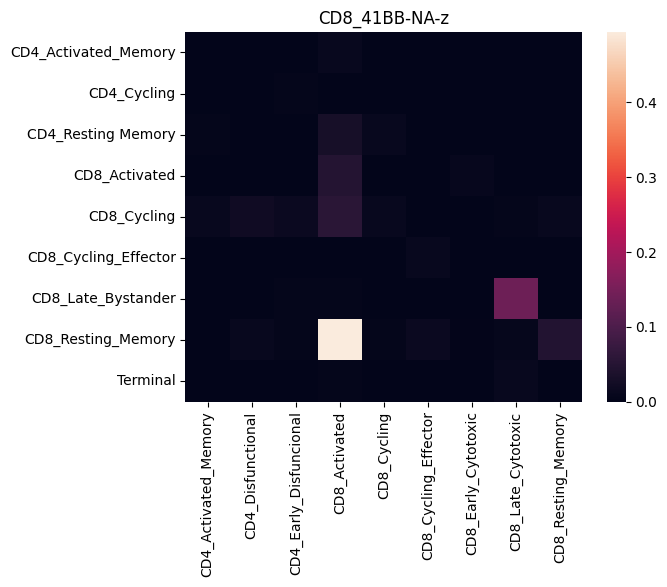

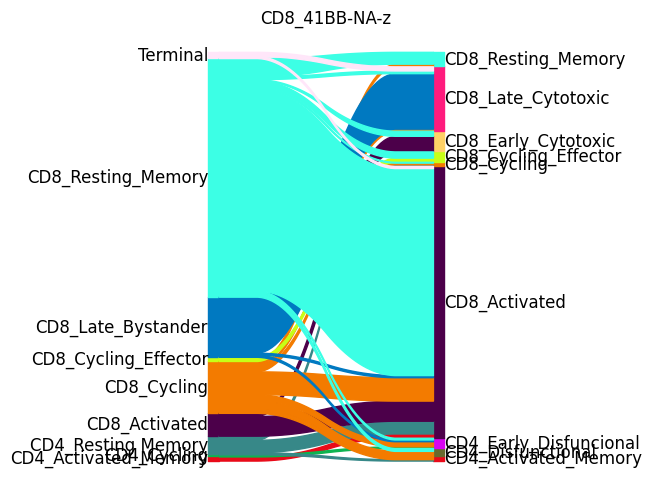

CD8_CD28-41BB-z


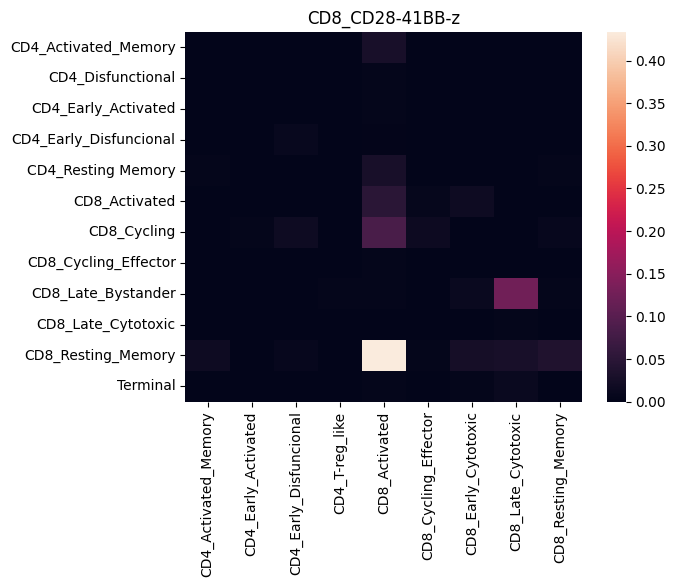

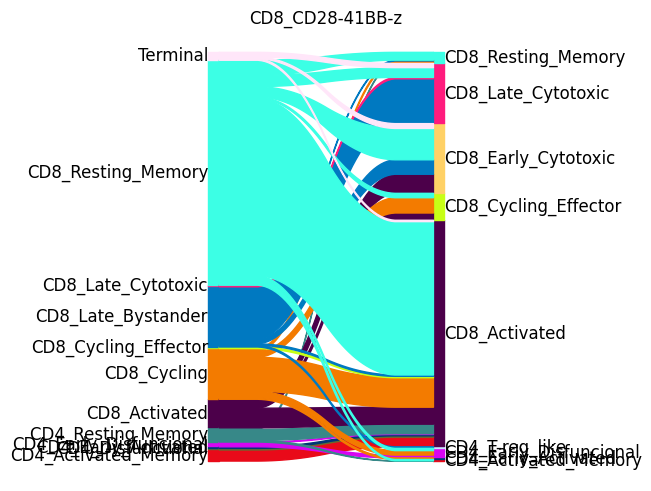

CD8_CD28-CD28-z


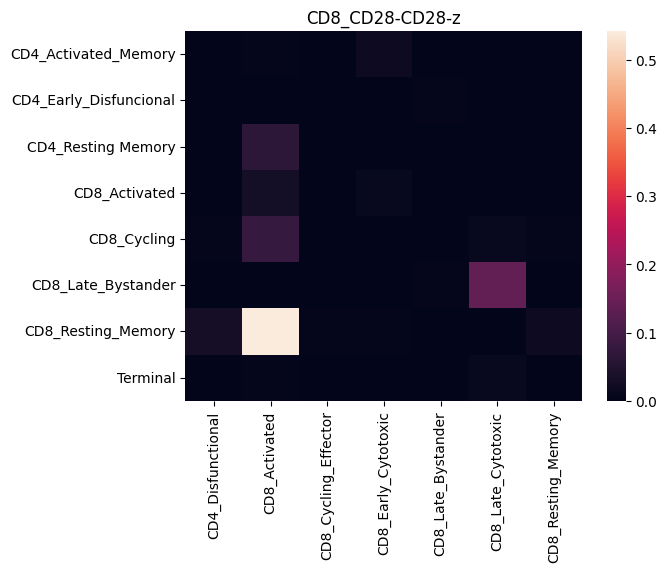

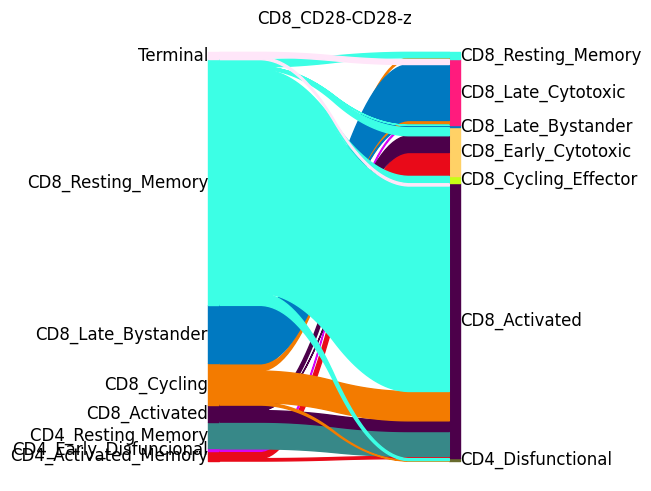

CD8_CD28-CD40-z


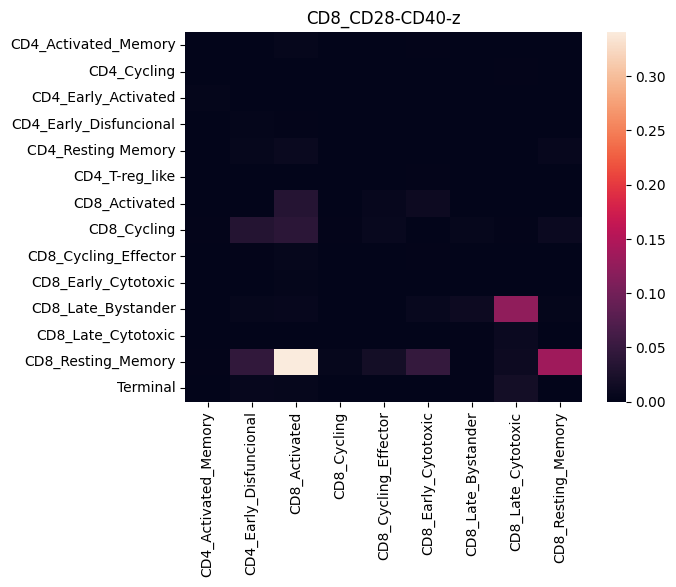

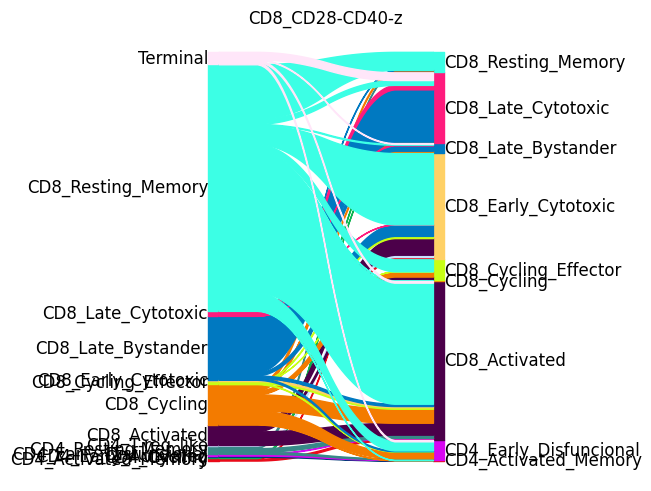

CD8_CD28-CTLA4-z


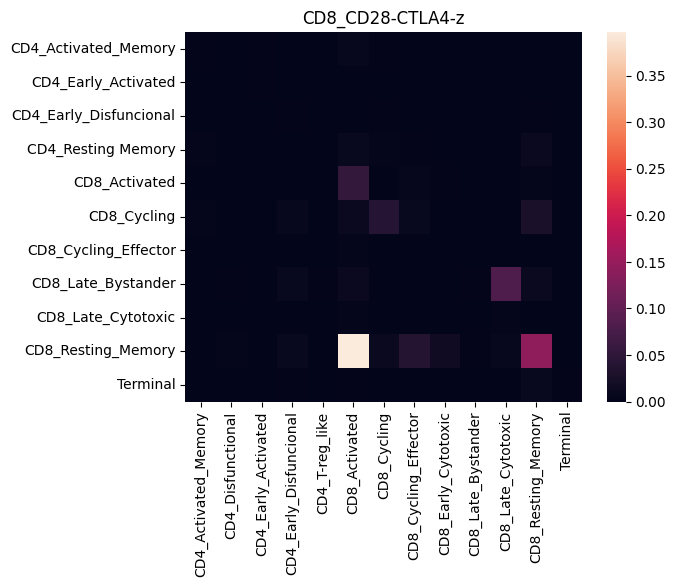

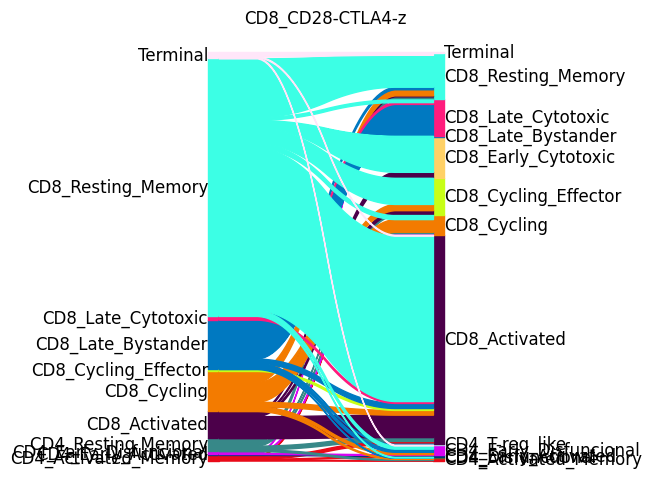

CD8_CD28-IL15RA-z


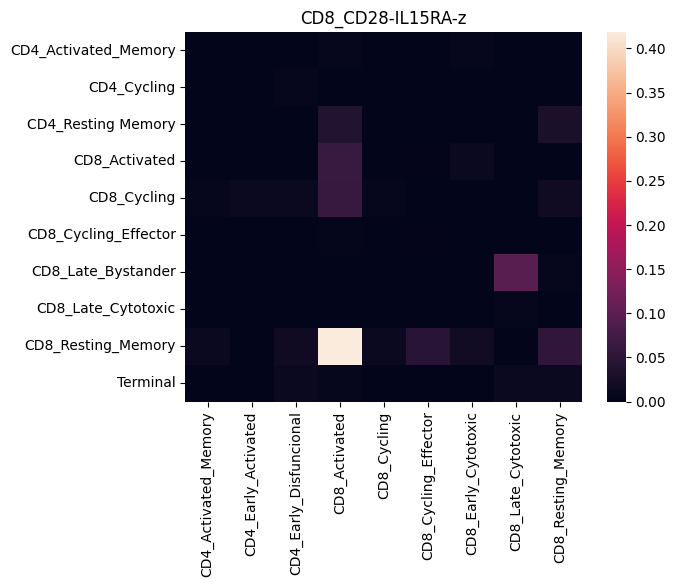

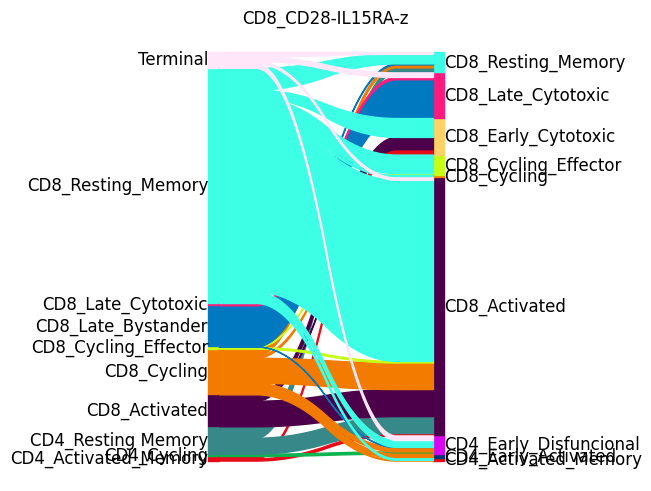

CD8_CD28-NA-z


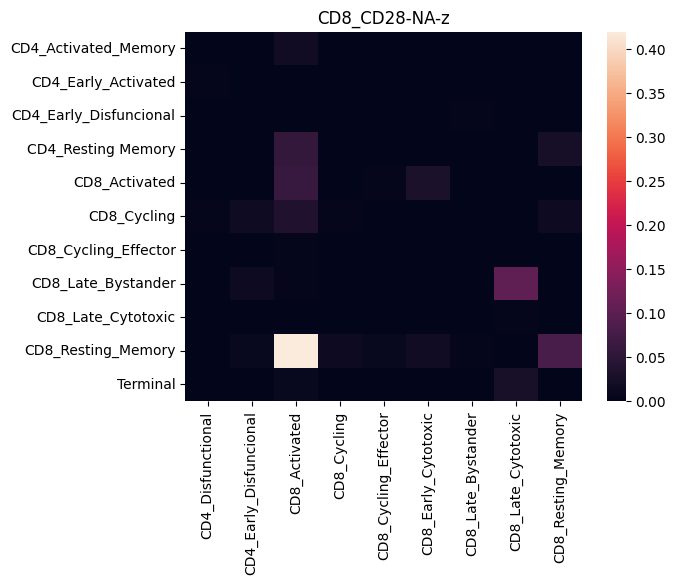

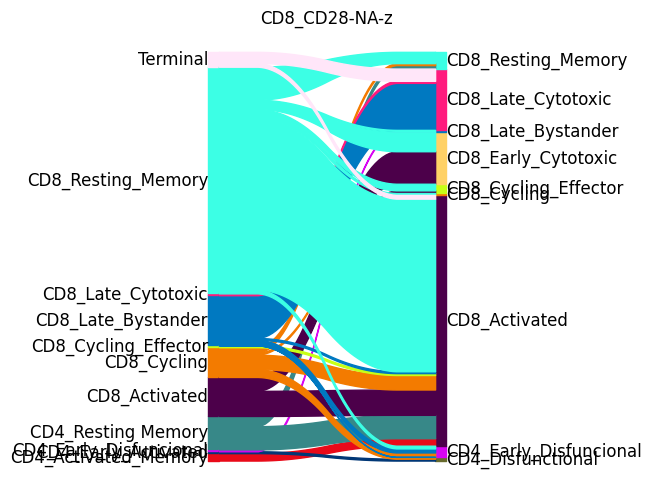

CD8_CD40-41BB-z


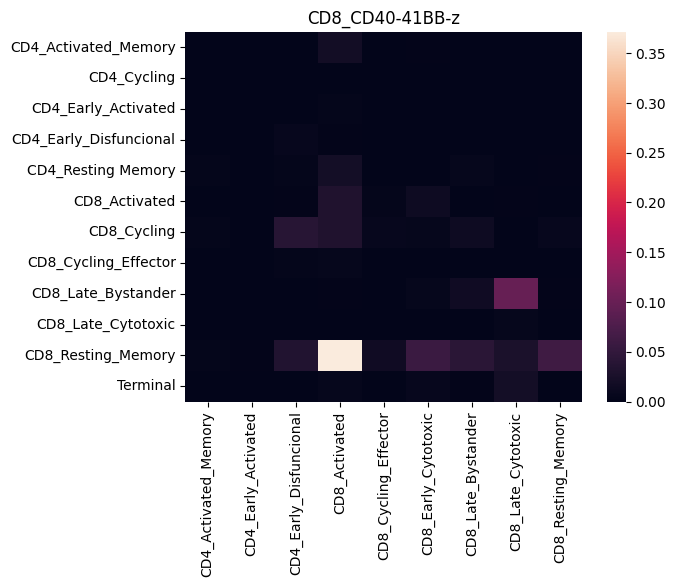

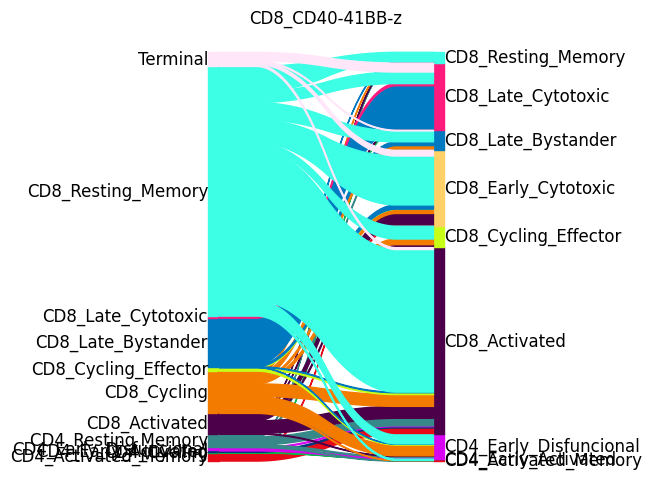

CD8_CD40-CD28-z


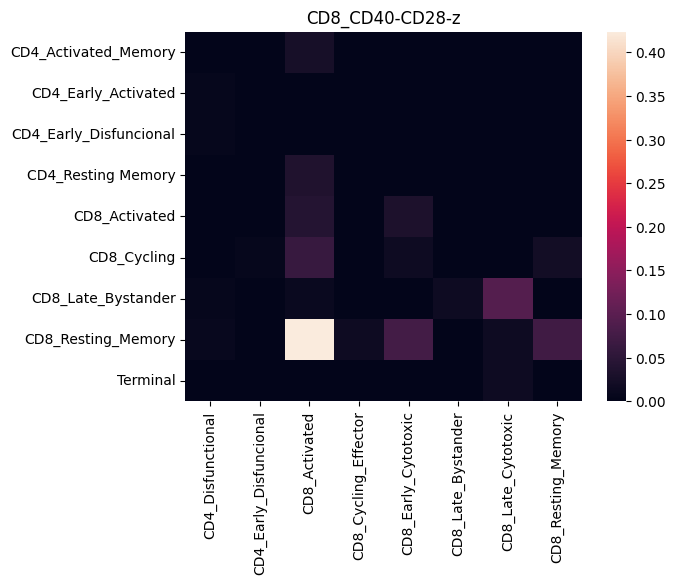

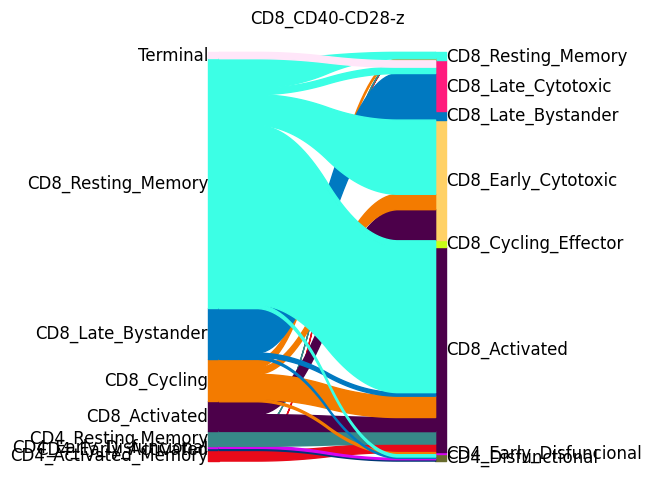

CD8_CD40-CD40-z


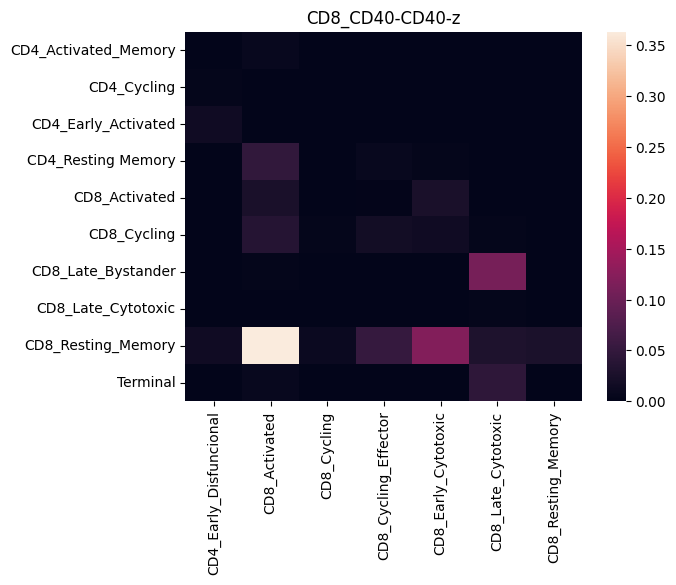

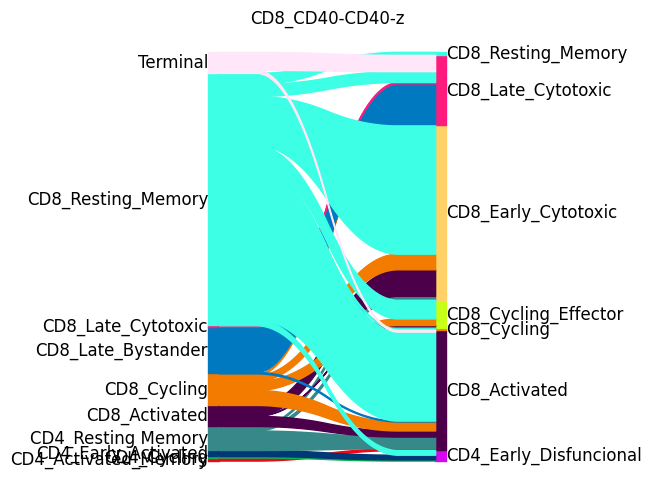

CD8_CD40-CTLA4-z


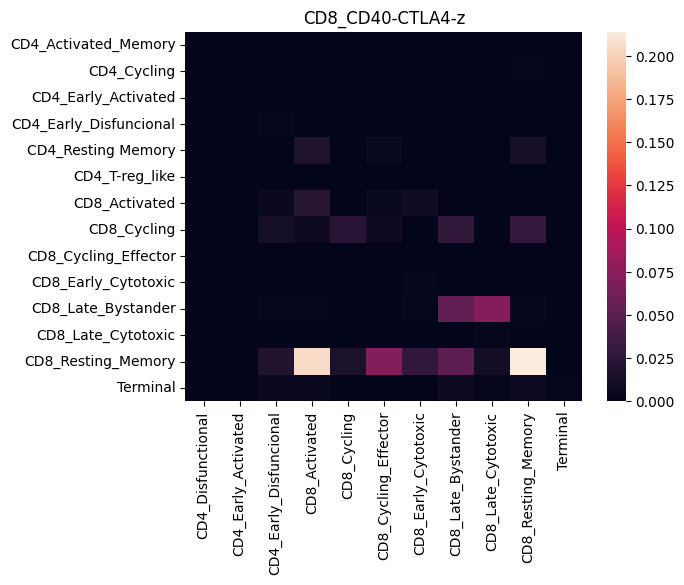

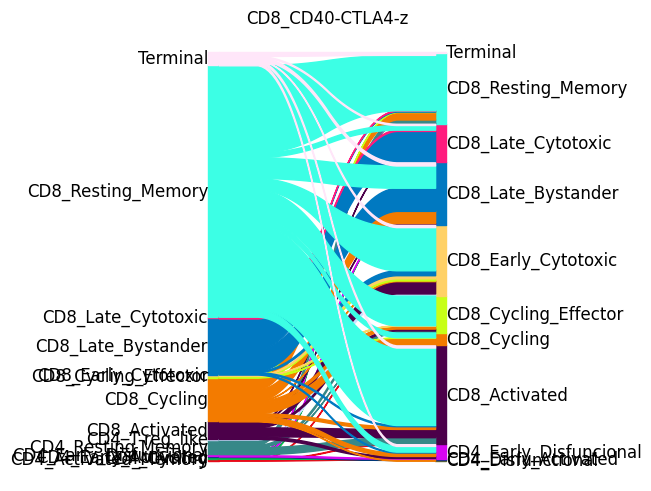

CD8_CD40-IL15RA-z


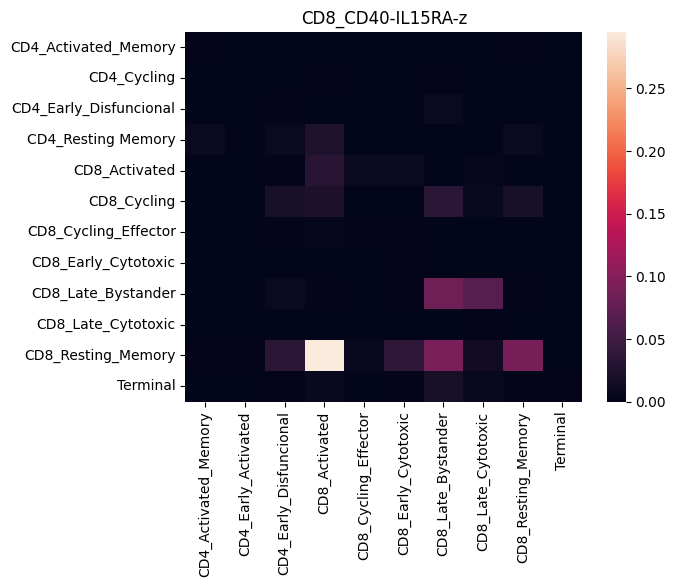

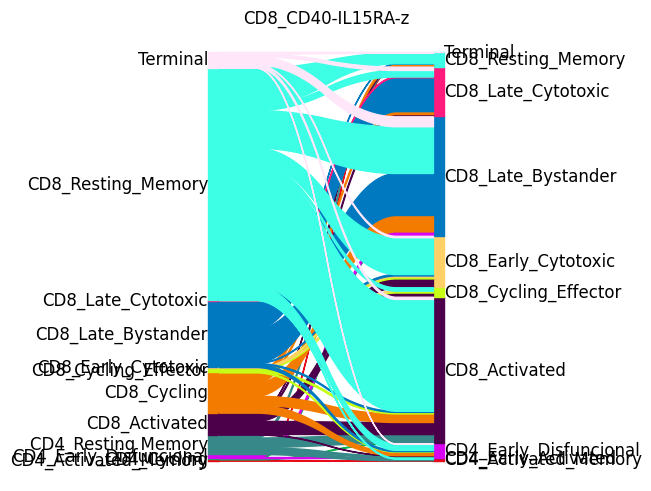

CD8_CD40-NA-z


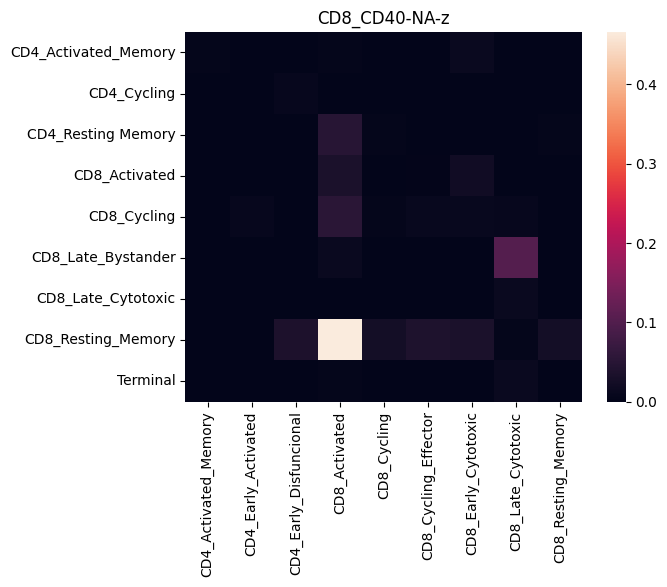

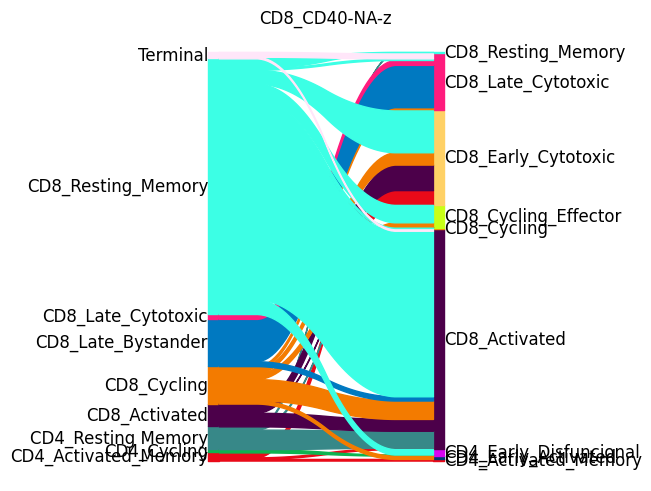

CD8_CTLA4-41BB-z


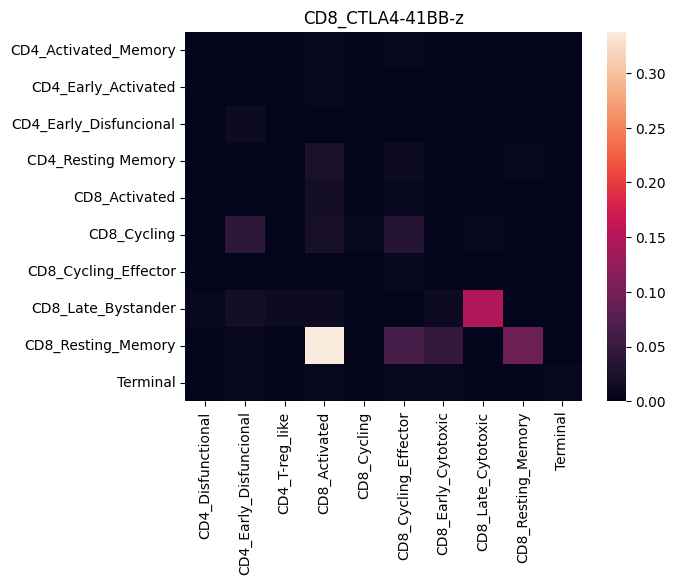

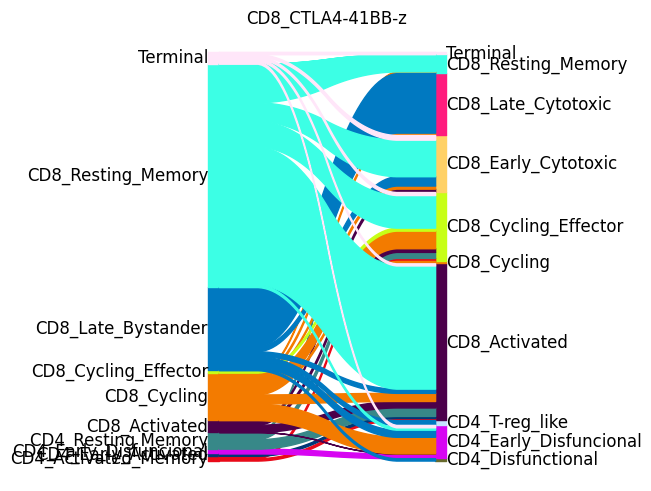

CD8_CTLA4-CD28-z


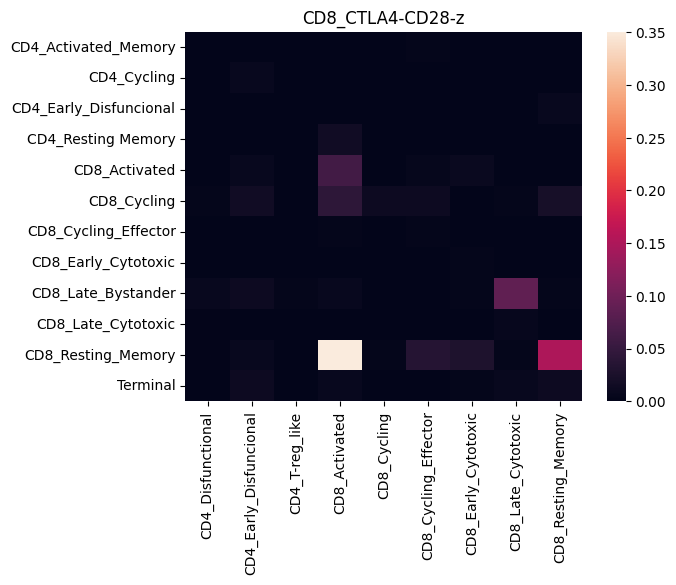

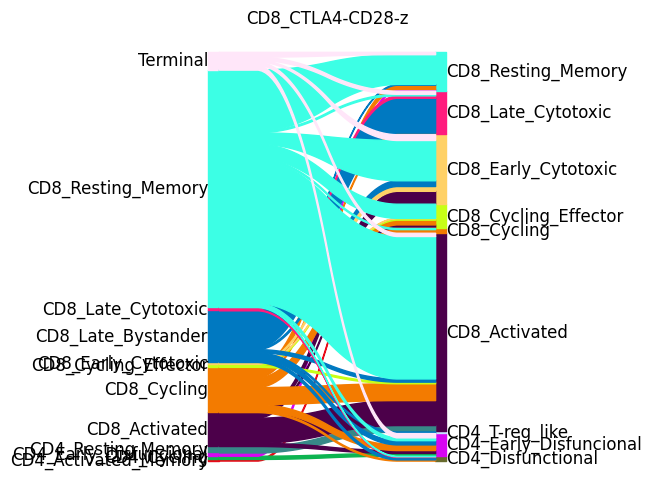

CD8_CTLA4-CD40-z


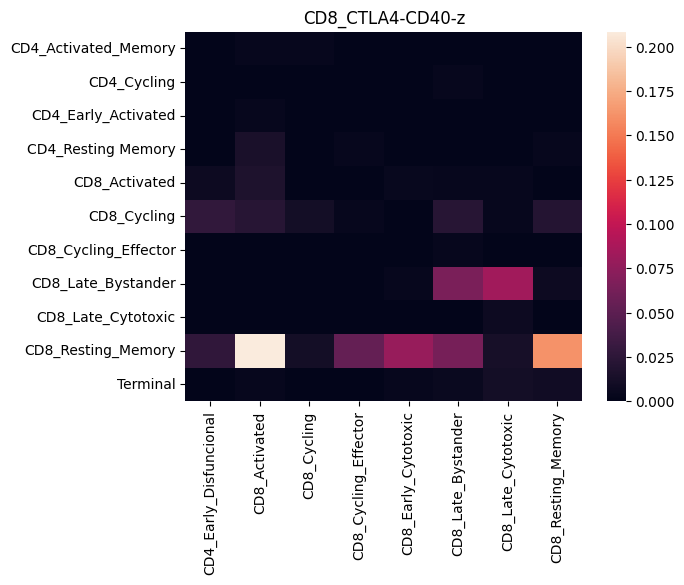

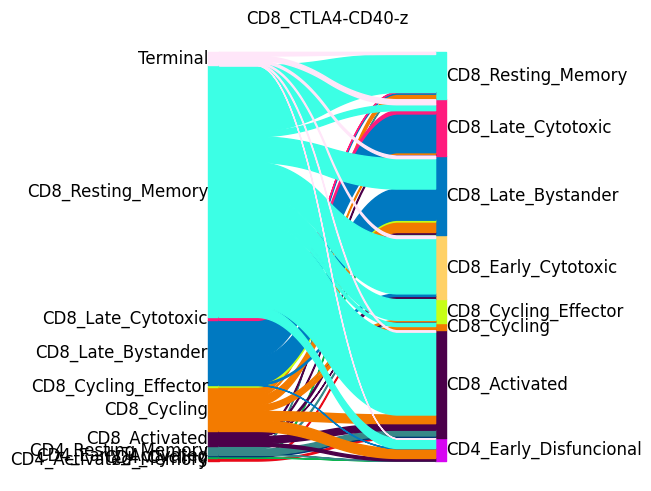

CD8_CTLA4-CTLA4-z


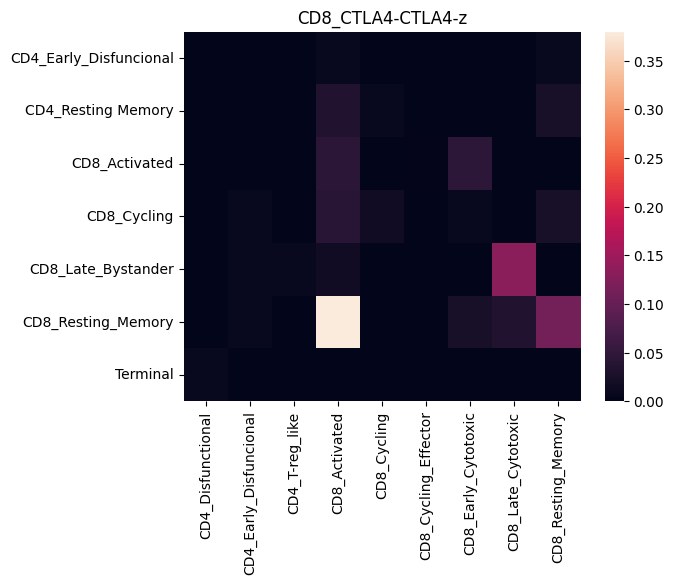

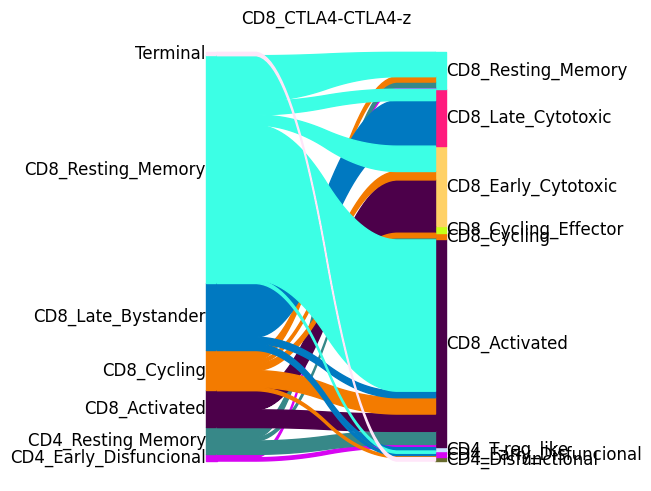

CD8_CTLA4-IL15RA-z


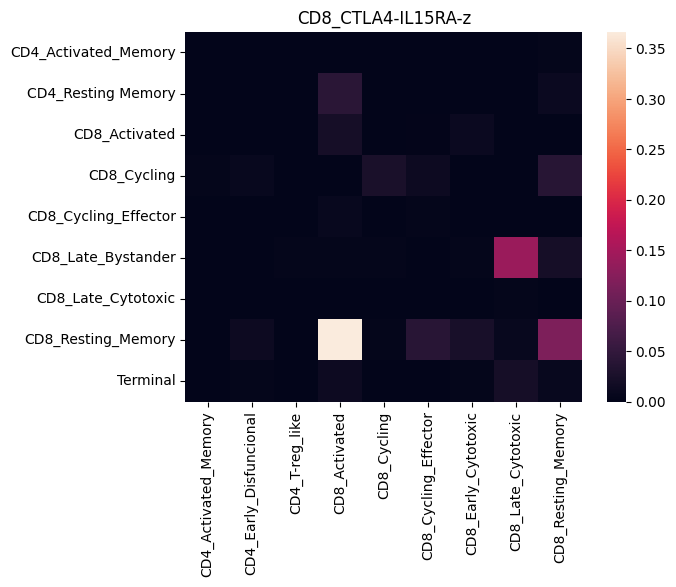

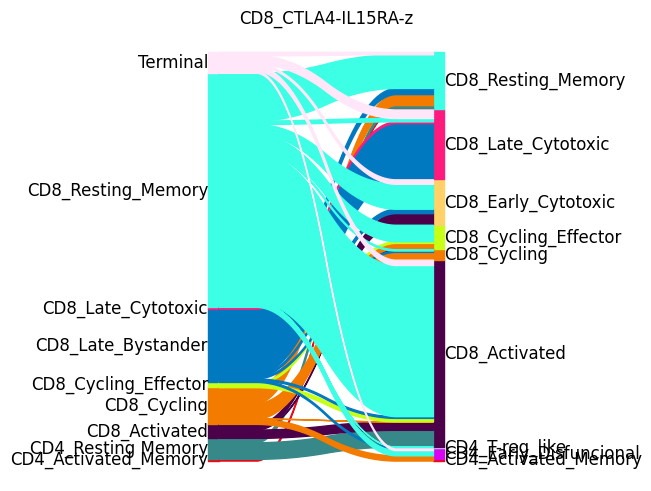

CD8_CTLA4-NA-z


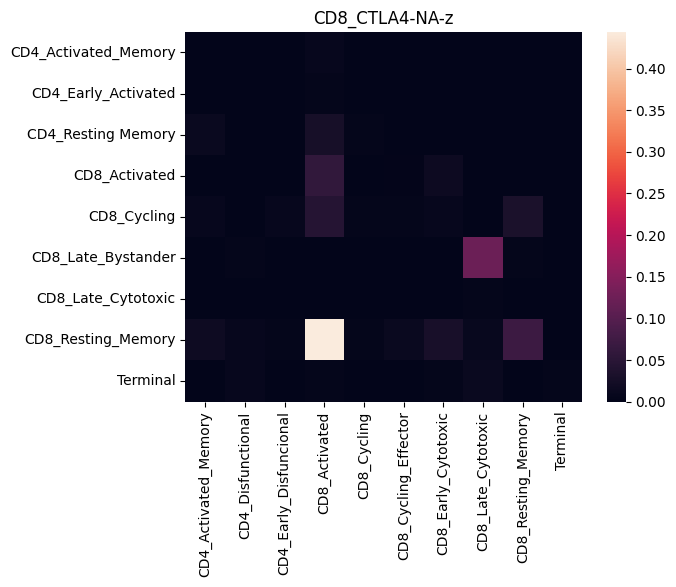

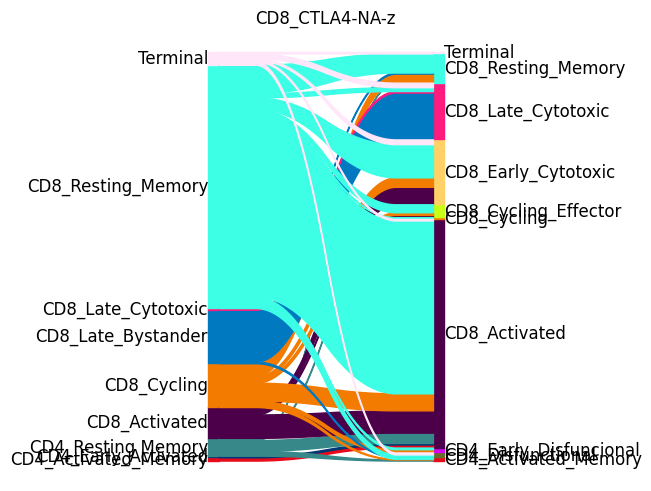

CD8_IL15RA-41BB-z


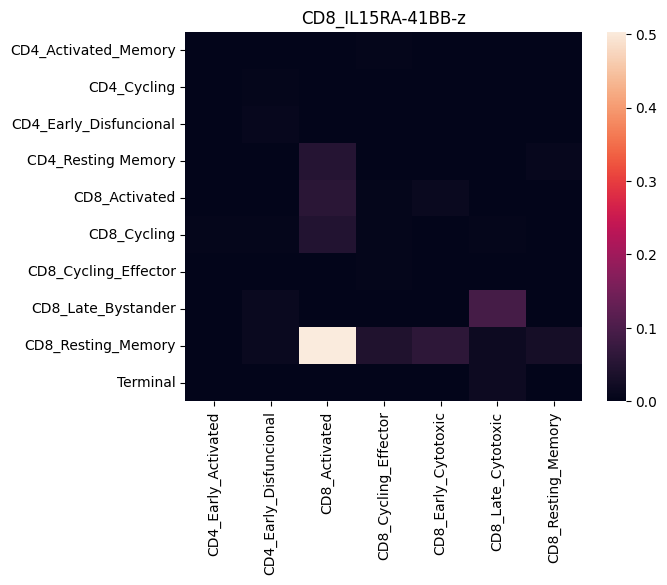

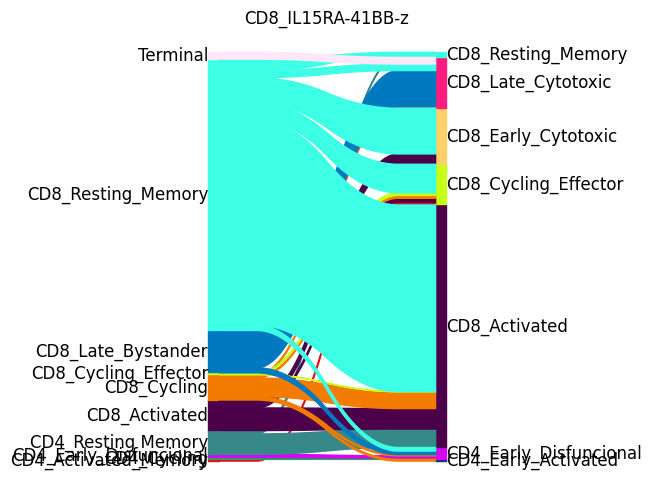

CD8_IL15RA-CD28-z


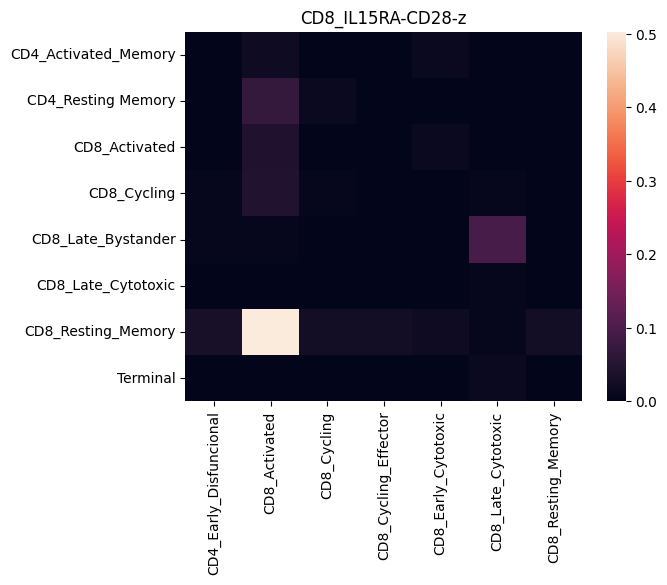

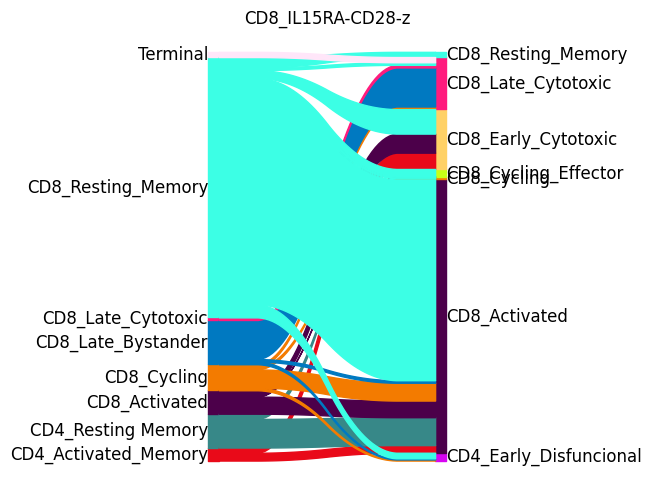

CD8_IL15RA-CD40-z


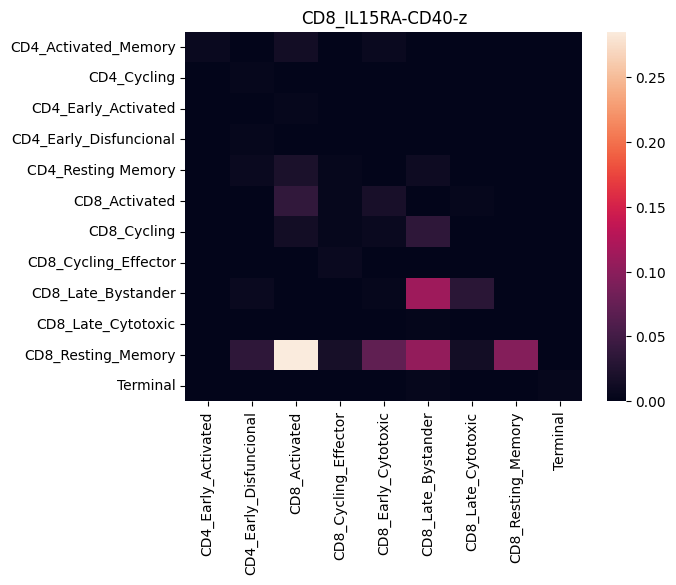

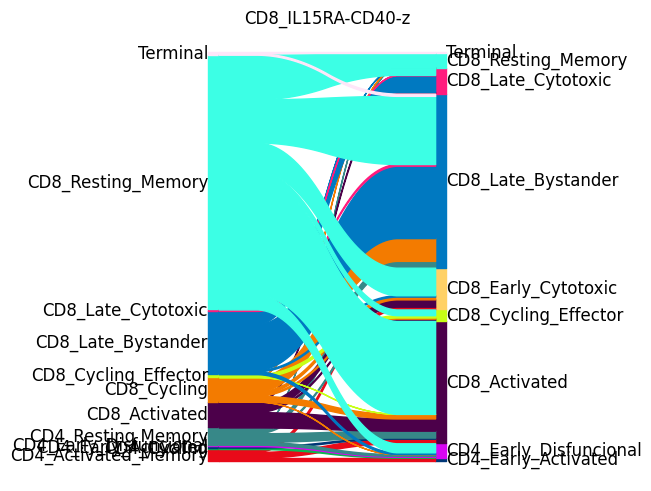

CD8_IL15RA-CTLA4-z


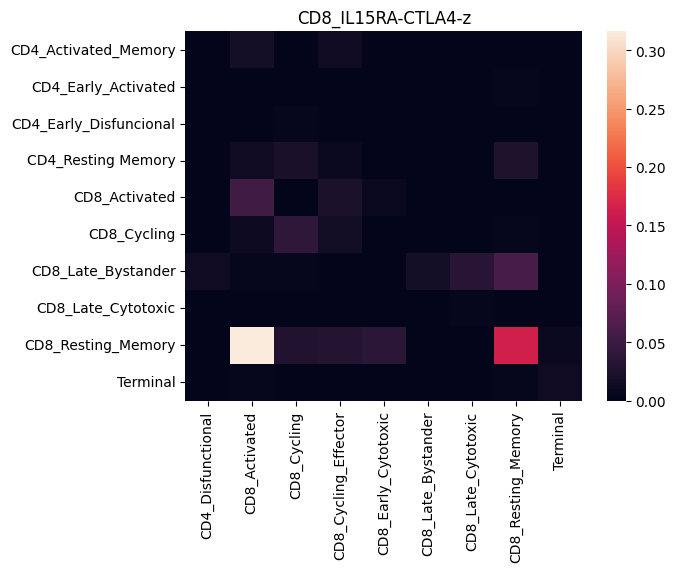

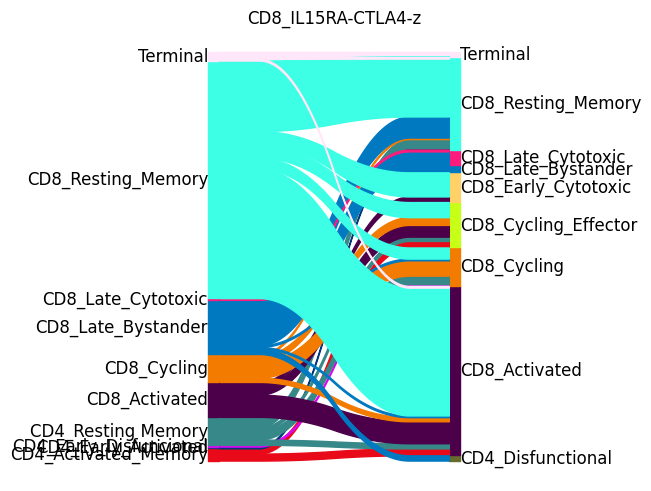

CD8_IL15RA-IL15RA-z


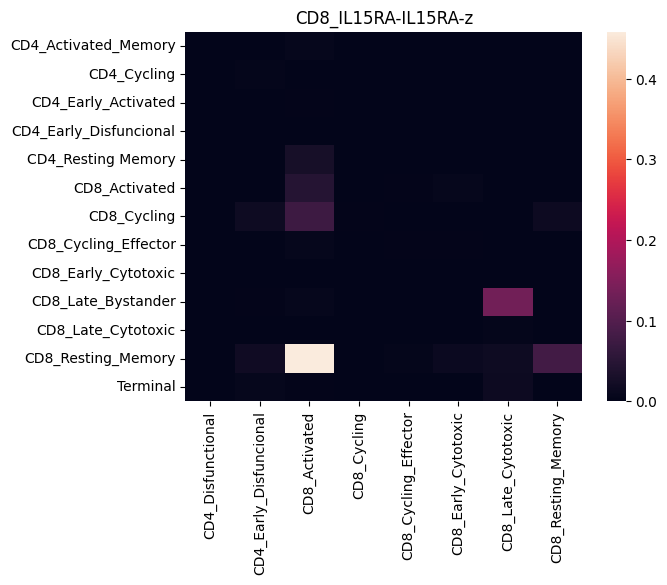

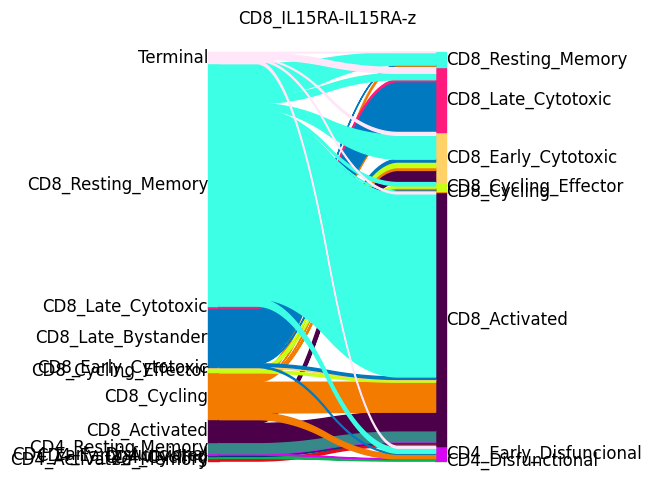

CD8_IL15RA-NA-z


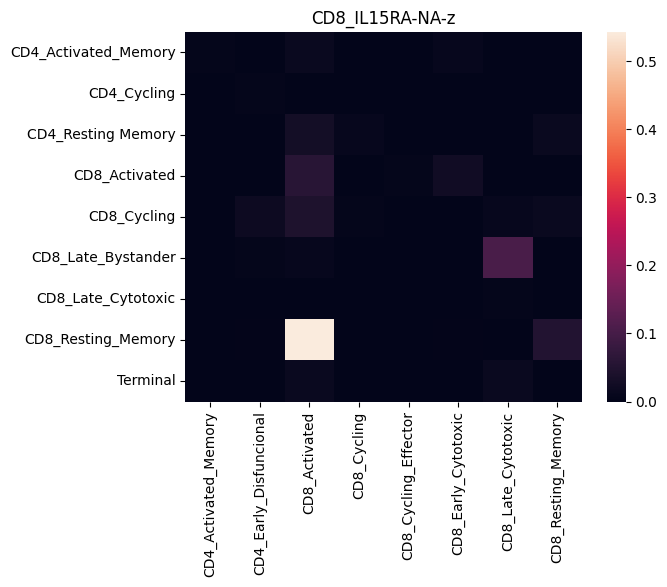

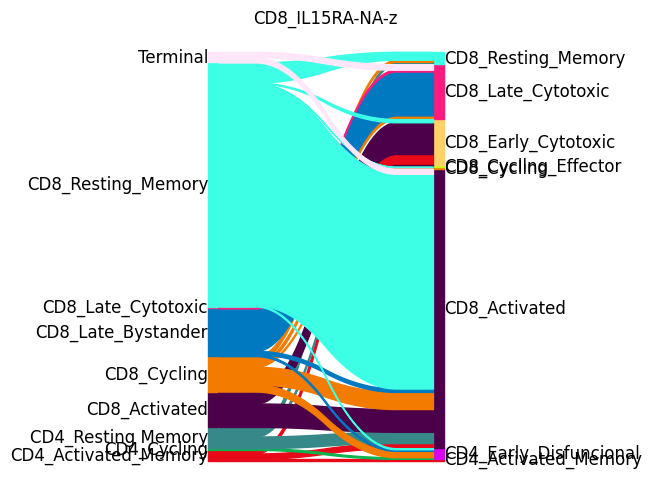

In [10]:
all_couplings = []
for subset_CAR in meta["subset_CAR"].unique():
    print(subset_CAR)
    x=jnp.array(data.loc[(meta["subset_CAR"]==subset_CAR)&(meta["dtype"]=="source")])
    y=jnp.array(data[(meta["subset_CAR"]==subset_CAR)&(meta["dtype"]=="transport")])
    celltype_x = celltyper.predict(x)
    celltype_y = celltyper.predict(y)
    geom = pointcloud.PointCloud(x, y, epsilon=1e-3)
    solve_fn = jax.jit(linear.solve)
    ot = solve_fn(geom)

    # Source are rows, transport columns
    coupling =pd.DataFrame(ot.matrix, columns=celltype_y, index=celltype_x)
    # Sum transports per cell type
    coupling = coupling.groupby(level=0).sum().T.groupby(level=0).sum().T
    all_couplings.append(coupling)
    sns.heatmap(coupling)
    plt.title(subset_CAR)
    plt.savefig(f"/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Figures/cmonge/transportation/{subset_CAR}_coupling.pdf",
               bbox_inches="tight")
    plt.show()
    plt.close()

    source_cell_size = pd.DataFrame(celltype_x, columns=["celltype"]).groupby("celltype").size()
    target_cell_size = pd.DataFrame(celltype_y, columns=["celltype"]).groupby("celltype").size()
    
    f = sankey_with_moscot([coupling], source_cell_size, target_cell_size, colorDict=colordict, title=subset_CAR)
    mpl.pyplot.savefig(f"/Users/alicedriessen/Box/LegacyFromOldColleagues/Alice/CAR_Tcells/Figures/cmonge/transportation/{subset_CAR}_sankey.pdf",
                bbox_inches="tight")
    mpl.pyplot.show()
    mpl.pyplot.close()
    # f.show()
    # f.close()

<Axes: >

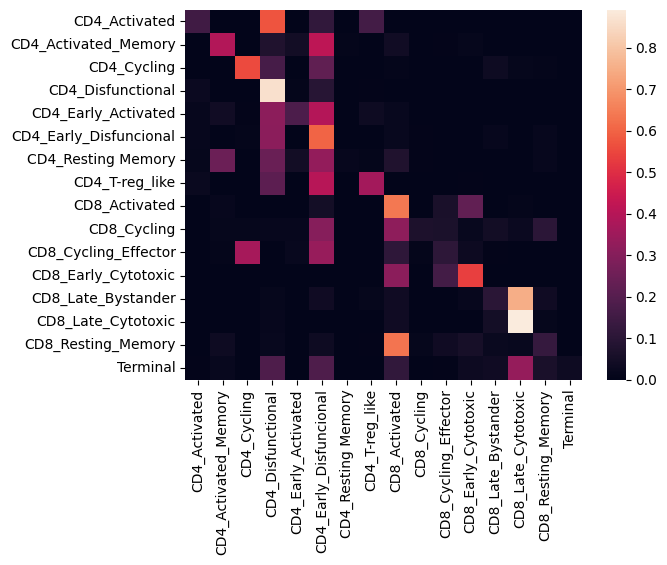

In [11]:
all_transports_sum = pd.concat(all_couplings).groupby(level=0).sum()
# Make sure columns and index are in same order
all_transports_sum = all_transports_sum.reindex(sorted(all_transports_sum.columns), axis=1)
all_transports_sum = all_transports_sum.reindex(sorted(all_transports_sum.index), axis=0)
# Row normalise
all_transports_sum = all_transports_sum.divide(all_transports_sum.sum(axis=1), axis=0)
sns.heatmap(all_transports_sum)

<Axes: >

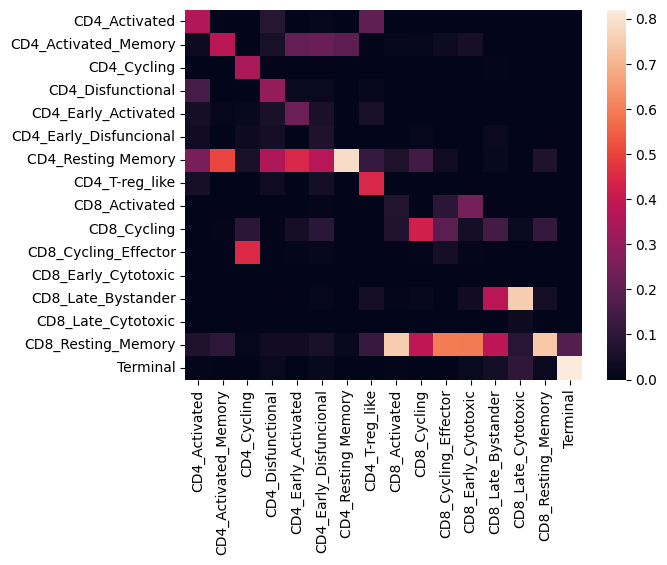

In [12]:
all_transports_sum = pd.concat(all_couplings).groupby(level=0).sum()
# Make sure columns and index are in same order
all_transports_sum = all_transports_sum.reindex(sorted(all_transports_sum.columns), axis=1)
all_transports_sum = all_transports_sum.reindex(sorted(all_transports_sum.index), axis=0)
# Column normalise
all_transports_sum = all_transports_sum.divide(all_transports_sum.sum(axis=0), axis=1)
sns.heatmap(all_transports_sum)